# Lab 7- Data Analysis


## Exercise 1: Reading

### HiggsML
In 2014, some of my colleagues from the ATLAS experiment put together a Higgs Machine Learning Challenge, which was hosted on [Kaggle](https://www.kaggle.com). Please read sections 1 and 3 (skip/skim 2) of [The HiggsML Technical Documentation](https://higgsml.lal.in2p3.fr/files/2014/04/documentation_v1.8.pdf). 

Kaggle is a platform for data science competitions, with cash awards for winners. Kaggle currently hosts over 50,000 public datasets and associated competitions. Later in the course we will look at a variety of problems hosted on Kaggle and similar platforms. 

### SUSY Dataset

For the next few labs we will use datasets used in the [first paper on Deep Learning in High Energy physics](https://arxiv.org/pdf/1402.4735.pdf). Please read up to the "Deep Learning" section (end of page 5). This paper demonstrates that Deep Neural Networks can learn from raw data the features that are typically used by physicists for searches for exotics particles. The authors provide the data they used for this paper. They considered two benchmark scenarios: Higgs and SUSY.

## Exercise 2: Download SUSY Dataset

The information about the dataset can be found at the [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/index.php). We'll start with the [SUSY Dataset](https://archive.ics.uci.edu/ml/datasets/SUSY). 

### Download
In a terminal, download the data directly from the source and then decompress it. For example:

* To download:
    * On Mac OS: 
    `curl http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz > SUSY.csv.gz`

    * In linux:
    `wget http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz`

* To uncompress:
`gunzip SUSY.csv.gz`

In [1]:
#!curl http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz > SUSY.csv.gz

In [2]:
#!rm SUSY.csv

In [3]:
#!gunzip SUSY.csv.gz

In [4]:
ls -lh

total 17040
-rw-r--r--@ 1 binoy.saha  staff   372K Apr  2 18:08 Lab.7.ipynb
-rw-r--r--@ 1 binoy.saha  staff   8.0M Mar 20 15:54 Lab.7.pdf


The data is provided as a comma separated file.

In [9]:
filename="SUSY.csv"
# print out the first 5 lines using unix head command
!head -5  "SUSY.csv"

0.000000000000000000e+00,9.728614687919616699e-01,6.538545489311218262e-01,1.176224589347839355e+00,1.157156467437744141e+00,-1.739873170852661133e+00,-8.743090629577636719e-01,5.677649974822998047e-01,-1.750000417232513428e-01,8.100607395172119141e-01,-2.525521218776702881e-01,1.921887040138244629e+00,8.896374106407165527e-01,4.107718467712402344e-01,1.145620822906494141e+00,1.932632088661193848e+00,9.944640994071960449e-01,1.367815494537353516e+00,4.071449860930442810e-02
1.000000000000000000e+00,1.667973041534423828e+00,6.419061869382858276e-02,-1.225171446800231934e+00,5.061022043228149414e-01,-3.389389812946319580e-01,1.672542810440063477e+00,3.475464344024658203e+00,-1.219136357307434082e+00,1.295456290245056152e-02,3.775173664093017578e+00,1.045977115631103516e+00,5.680512785911560059e-01,4.819284379482269287e-01,0.000000000000000000e+00,4.484102725982666016e-01,2.053557634353637695e-01,1.321893453598022461e+00,3.775840103626251221e-01
1.000000000000000000e+00,4.4483992457389831

## Reducing the dataset

This is a rather large dataset. If you have trouble loading it, we can easily make a new file with less data.

Here we look at the size of the data

In [6]:
!ls -lh

total 5151704
-rw-------@ 1 afarbin  staff    16K Mar 27 11:51 Lab.7.ipynb
-rw-r--r--@ 1 afarbin  staff   8.0M Mar 20 12:18 Lab.7.pdf
-rw-r--r--@ 1 afarbin  staff   228M Mar 20 13:50 SUSY-small.csv
-rw-r--r--@ 1 afarbin  staff   2.2G Mar 20 11:36 SUSY.csv


We see that we have 5 million datapoints.

In [6]:
!wc -l SUSY.csv

 5000000 SUSY.csv


We create a new file of the first half million. This is sufficient for our needs in this lab:

In [7]:
!head -500000 SUSY.csv > SUSY-small.csv

In [9]:
ls -lh

total 5176496
-rw-------@ 1 afarbin  staff    16K Mar 27 11:51 Lab.7.ipynb
-rw-r--r--@ 1 afarbin  staff   8.0M Mar 20 12:18 Lab.7.pdf
-rw-r--r--@ 1 afarbin  staff   228M Mar 27 12:56 SUSY-small.csv
-rw-r--r--@ 1 afarbin  staff   2.2G Mar 20 11:36 SUSY.csv


In [8]:
! wc -l SUSY-small.csv

  500000 SUSY-small.csv


Use this file for the rest of the lab to make this run faster.

### First Look

Each row represents a LHC collision event. Each column contains some observable from that event. The variable names are ([based on documentation](https://archive.ics.uci.edu/ml/datasets/SUSY)):

In [38]:
VarNames=["signal", "l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

Some of these variables represent the "raw" kinematics of the observed final state particles, while others are "features" that are derived from these raw quantities:

In [39]:
RawNames=["l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi"]
FeatureNames=list(set(VarNames[1:]).difference(RawNames))

In [13]:
RawNames

['l_1_pT',
 'l_1_eta',
 'l_1_phi',
 'l_2_pT',
 'l_2_eta',
 'l_2_phi',
 'MET',
 'MET_phi']

In [14]:
FeatureNames

['R',
 'dPhi_r_b',
 'MT2',
 'cos_theta_r1',
 'M_TR_2',
 'M_Delta_R',
 'MET_rel',
 'S_R',
 'M_R',
 'axial_MET']

We will use pandas to read in the file, and matplotlib to make plots. The following ensures pandas is installed and sets everything up:

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

Now we can read the data into a pandas dataframe:

In [15]:
filename = "SUSY-small.csv"
df = pd.read_csv(filename, dtype='float64', names=VarNames)

You can see the data in Jupyter by just evaluateing the dataframe:

In [16]:
df

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0,0.0,0.972861,0.653855,1.176225,1.157156,-1.739873,-0.874309,0.567765,-0.175000,0.810061,-0.252552,1.921887,0.889637,0.410772,1.145621,1.932632,0.994464,1.367815,0.040714
1,1.0,1.667973,0.064191,-1.225171,0.506102,-0.338939,1.672543,3.475464,-1.219136,0.012955,3.775174,1.045977,0.568051,0.481928,0.000000,0.448410,0.205356,1.321893,0.377584
2,1.0,0.444840,-0.134298,-0.709972,0.451719,-1.613871,-0.768661,1.219918,0.504026,1.831248,-0.431385,0.526283,0.941514,1.587535,2.024308,0.603498,1.562374,1.135454,0.180910
3,1.0,0.381256,-0.976145,0.693152,0.448959,0.891753,-0.677328,2.033060,1.533041,3.046260,-1.005285,0.569386,1.015211,1.582217,1.551914,0.761215,1.715464,1.492257,0.090719
4,1.0,1.309996,-0.690089,-0.676259,1.589283,-0.693326,0.622907,1.087562,-0.381742,0.589204,1.365479,1.179295,0.968218,0.728563,0.000000,1.083158,0.043429,1.154854,0.094859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,0.0,0.719035,1.091879,0.291540,1.205962,-1.599117,-1.139445,0.424546,1.154849,0.637185,-0.091178,1.972156,0.697028,0.313636,0.988602,1.981573,0.744828,1.095080,0.006546
499996,1.0,0.910016,-0.364544,-0.777120,0.543648,-0.910632,-1.723707,2.864673,1.458272,2.176558,-0.590911,0.673695,1.662140,2.189362,1.195041,0.910815,1.181893,1.252362,0.826035
499997,1.0,0.842954,0.332476,-1.048564,1.347989,0.320496,-0.666358,0.450433,-0.411872,0.293407,0.630491,0.859920,0.403371,0.416258,0.591989,0.372003,0.716788,0.366991,0.265798
499998,0.0,1.370760,-1.162912,0.893499,2.118091,1.248496,-0.887211,0.164659,0.316840,0.215165,0.280418,3.087083,0.526929,0.151467,0.308067,3.098183,0.233042,0.876216,0.000593


The first column stores the "truth" label of whether an event was signal or not. Pandas makes it easy to create dataframes that store only the signal or background events:

In [17]:
df_sig=df[df.signal==1]
df_bkg=df[df.signal==0]

The following example plots the signal and background distributions of every variable. Note that we use VarNames[1:] to skip the first variable, which was the true label.

l_1_pT


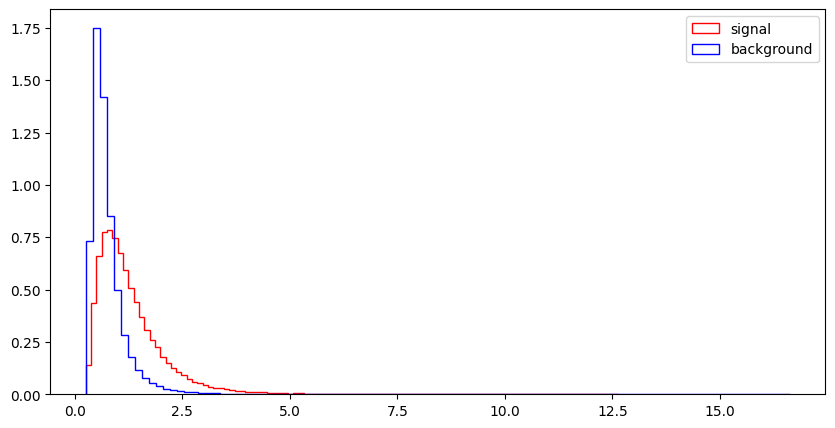

l_1_eta


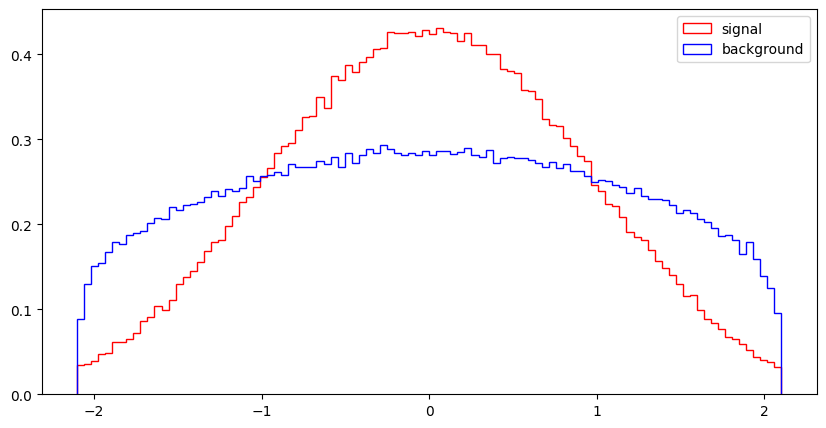

l_1_phi


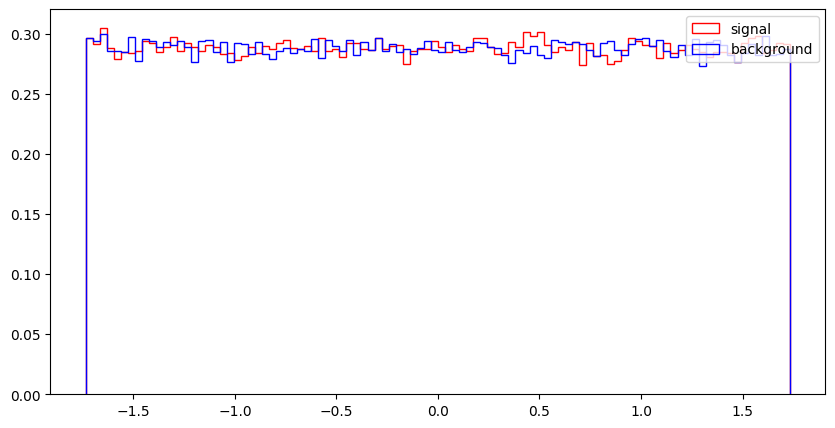

l_2_pT


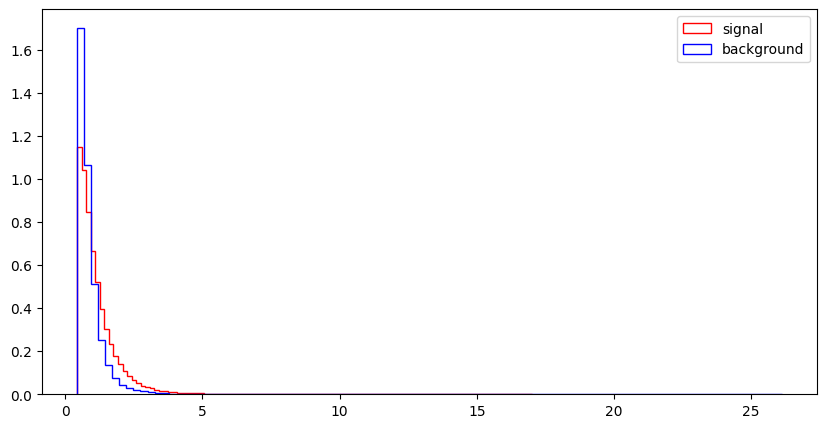

l_2_eta


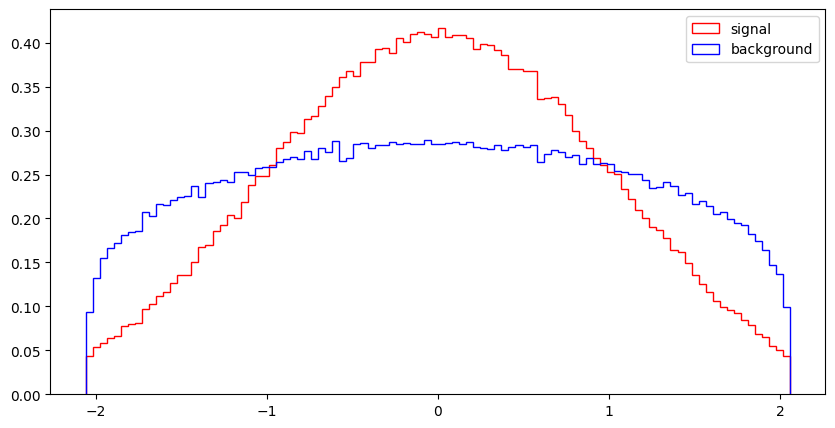

l_2_phi


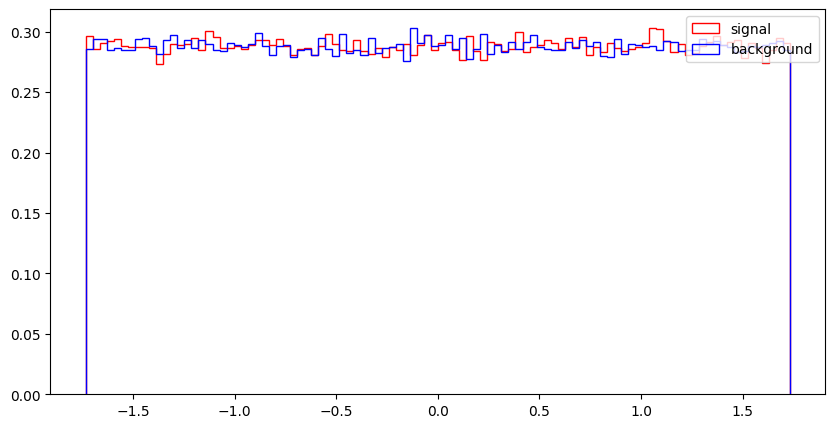

MET


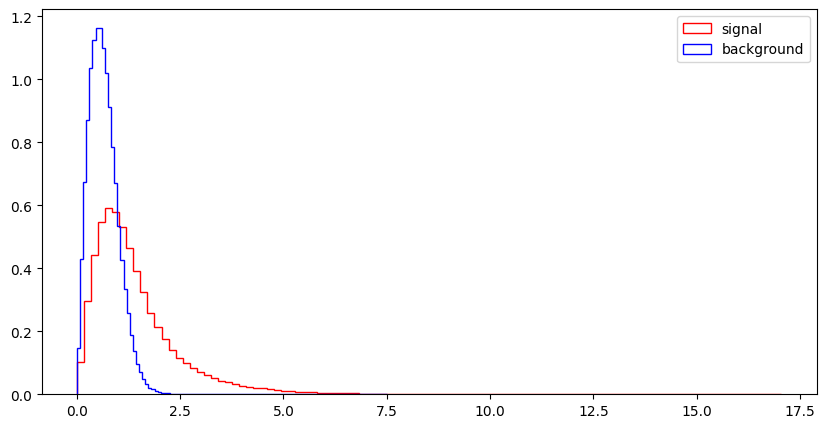

MET_phi


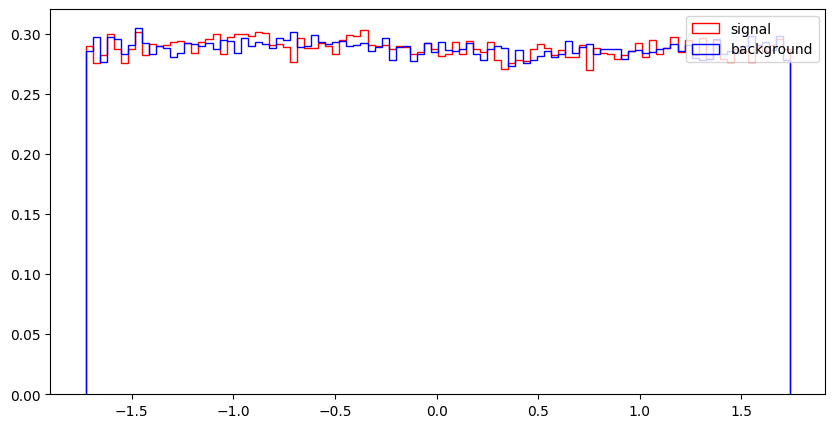

MET_rel


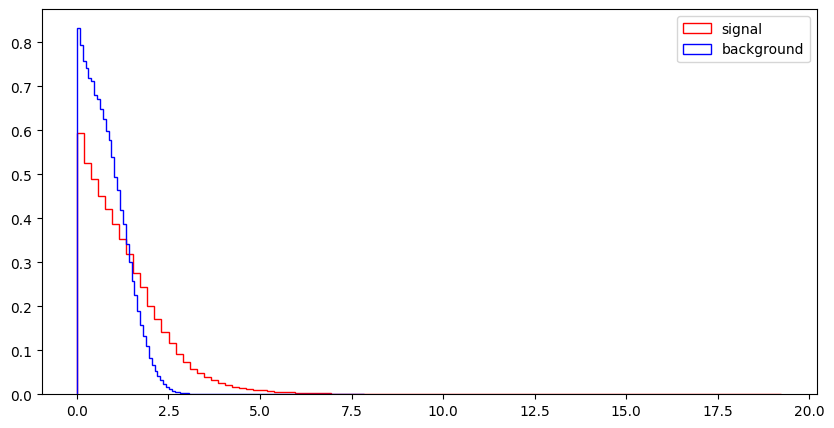

axial_MET


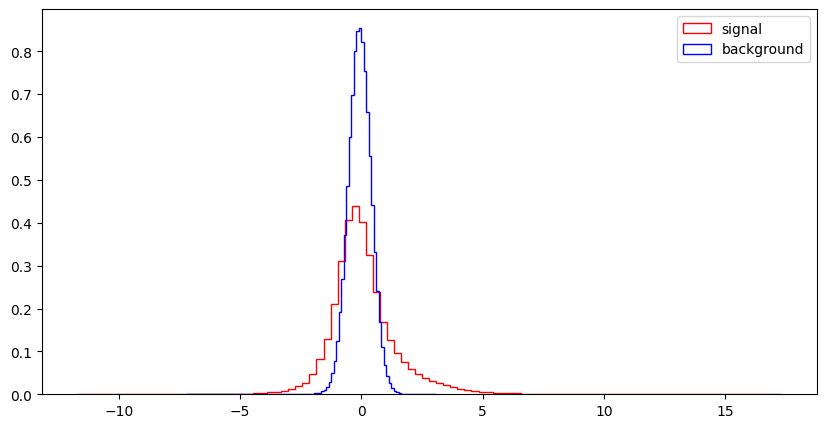

M_R


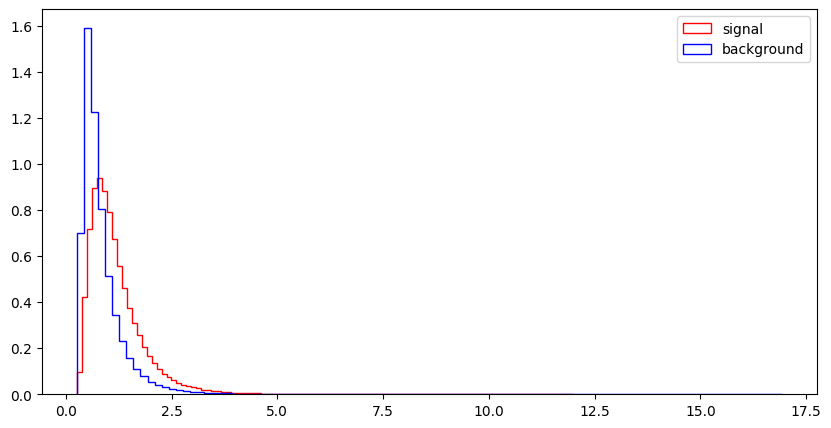

M_TR_2


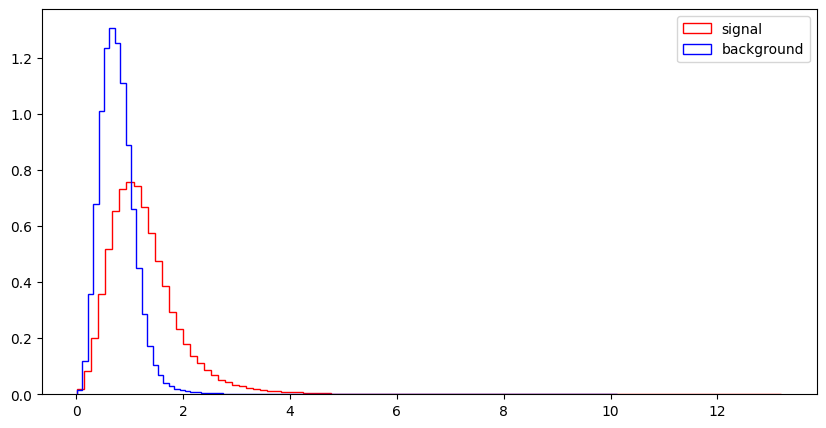

R


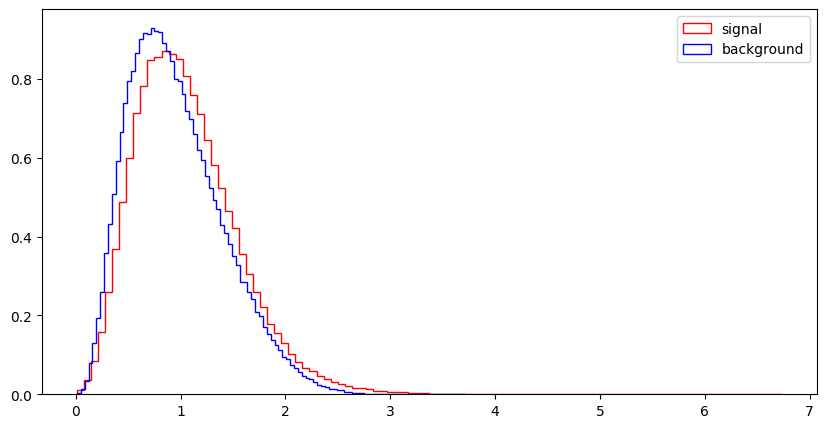

MT2


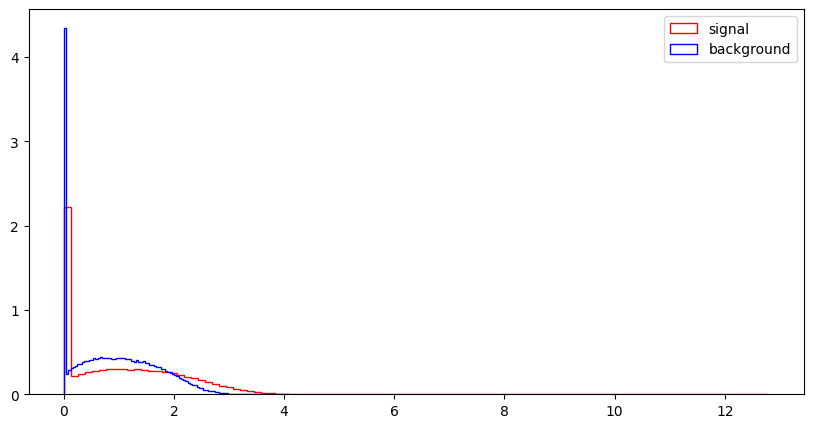

S_R


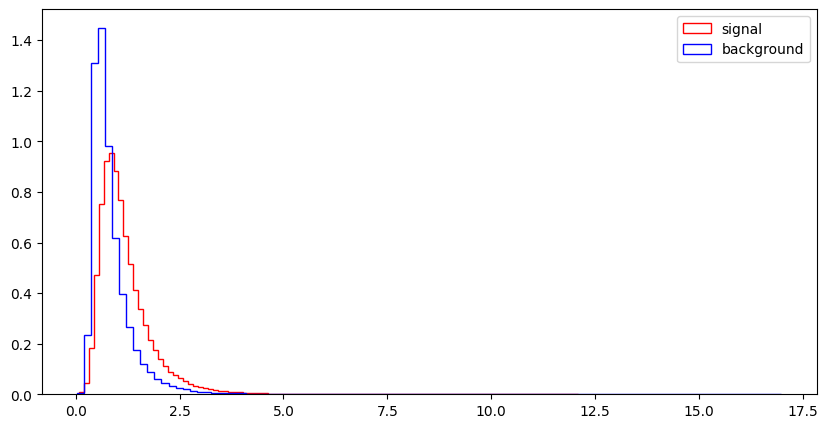

M_Delta_R


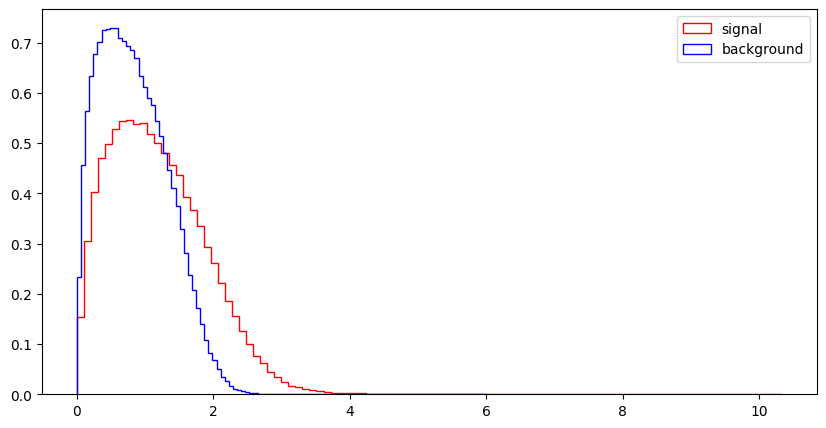

dPhi_r_b


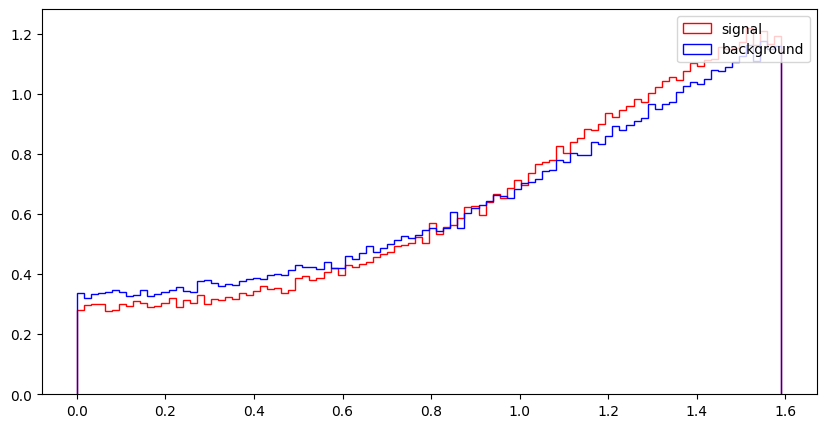

cos_theta_r1


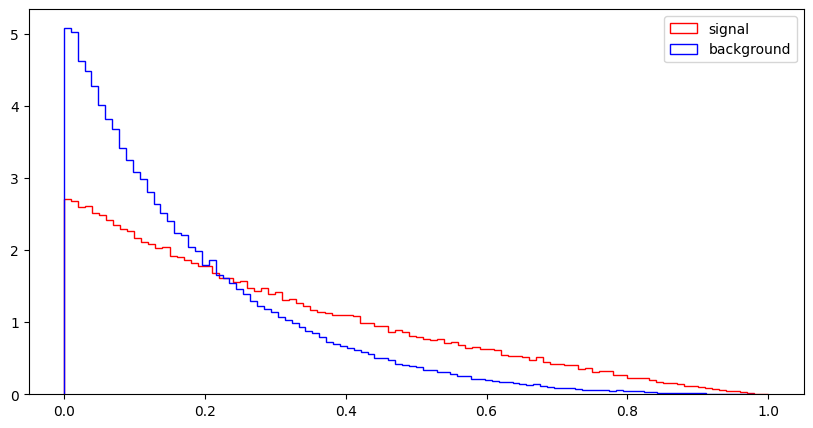

In [18]:
import numpy as np
for var in VarNames[1:]:
    print (var)
    plt.figure(figsize=(10,5))
    plt.hist(np.array(df_sig[var]),bins=100,histtype="step", color="red",label="signal",density=1, stacked=True)
    plt.hist(np.array(df_bkg[var]),bins=100,histtype="step", color="blue", label="background",density=1, stacked=True)
    plt.legend(loc='upper right')
    plt.show()

## Exercise 3: Make nice figures

Now use `matplotlib` to reproduce as closely as you can figures 5 and 6 from the paper. This exercise is intended to get you to familiarize yourself with making nicely formatted `matplotlib` figures with multiple plots. Note that the plots in the paper are actually wrong!

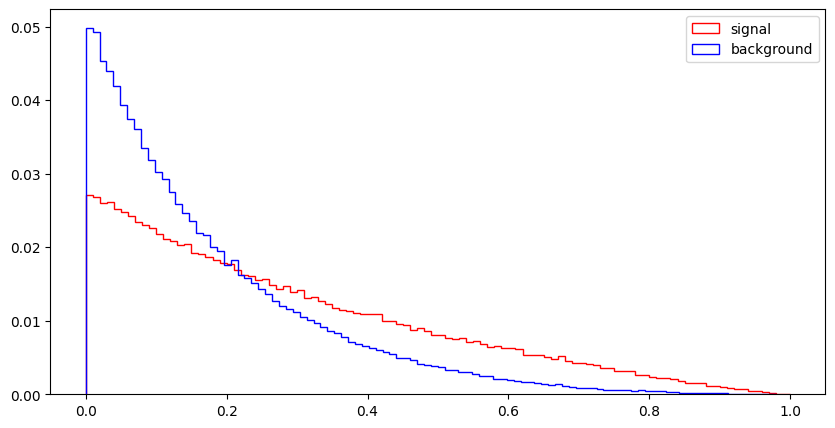

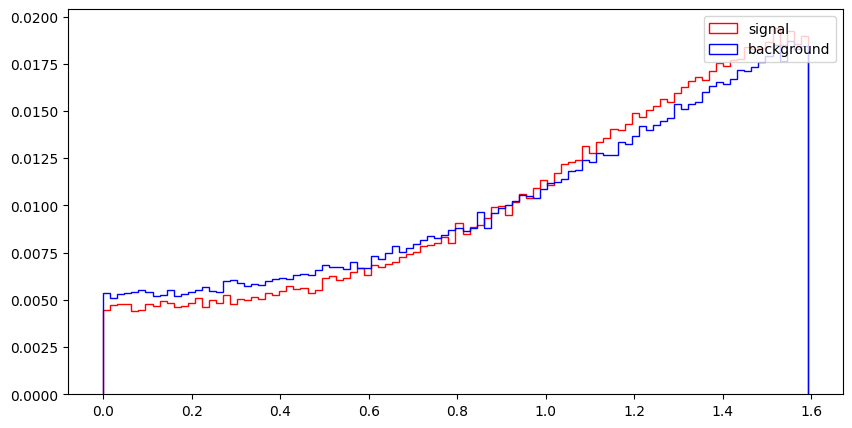

In [22]:
weight_sig = np.ones(len(df_sig)) / len(df_sig)
weight_bkg = np.ones(len(df_bkg)) / len(df_bkg)

plt.figure(figsize=(10,5))
plt.hist(np.array(df_sig["cos_theta_r1"]), bins=100, weights=weight_sig, histtype="step", color="red", label="signal")
plt.hist(np.array(df_bkg["cos_theta_r1"]), bins=100, weights=weight_bkg, histtype="step", color="blue", label="background")
plt.legend(loc='upper right')
plt.show()

plt.figure(figsize=(10,5))
plt.hist(np.array(df_sig["dPhi_r_b"]), bins=100, weights=weight_sig, histtype="step", color="red", label="signal")
plt.hist(np.array(df_bkg["dPhi_r_b"]), bins=100, weights=weight_bkg, histtype="step", color="blue", label="background")
plt.legend(loc='upper right')
plt.show()


## Exercise 4: Correlation

### Exercise 4.1

#### Part a
Write a function that creates pair plots and use it to compare variables in the SUSY sample, separately for low and high-level features. Refer to Lecture 13 for details. Do not use `seaborn`.

#### Part b
Making these plots can be slow because creating each plot initiates a full loop over the data. Make at least one modification to your function in part a to speed it up. Can you propose a different method of creating histograms that would speed up making such pair plots?

#### Part c
Which observables appear to be best for separating signal from background?

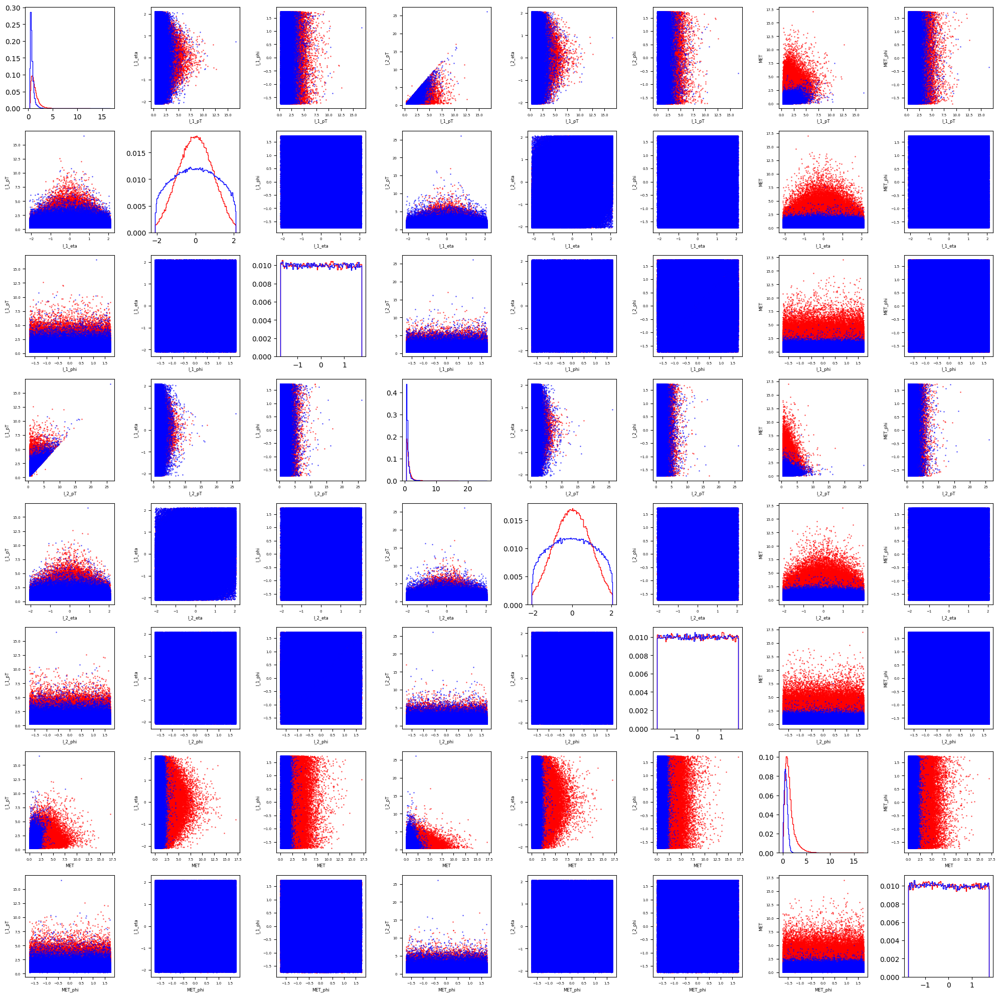

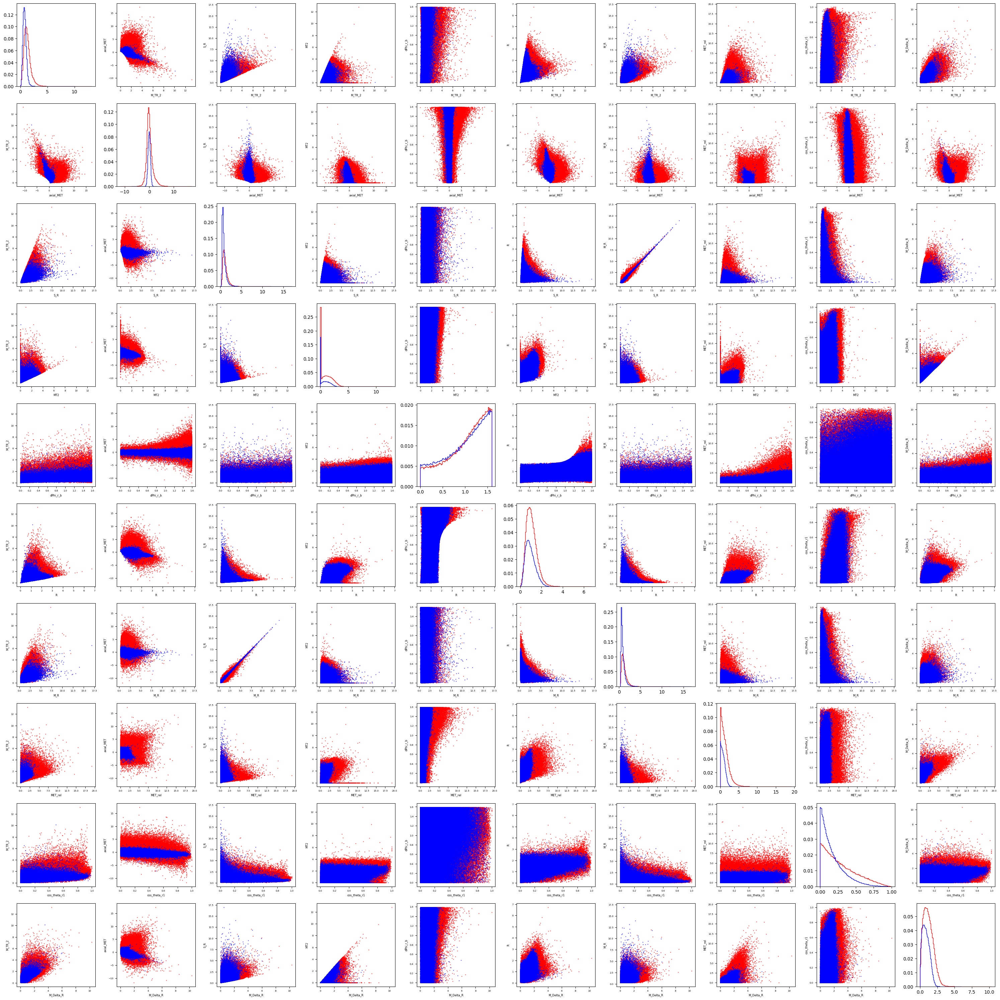

In [ ]:
#part A
# for RawNames:
len(RawNames)
fig, axs = plt.subplots(8, 8, figsize=(20, 20))
for i, feat1 in enumerate(RawNames):
    for j, feat2 in enumerate(RawNames):
        ax = axs[i][j]
        if i == j:
            ax.hist(np.array(df_sig[feat1]), bins=100, weights=weight_sig, histtype="step", color="red", label="signal")
            ax.hist(np.array(df_bkg[feat1]), bins=100, weights=weight_bkg, histtype="step", color="blue", label="background")
        else:
            ax.scatter(df_sig[feat1], df_sig[feat2], color="red", label="signal", alpha=0.5, s=1)
            ax.scatter(df_bkg[feat1], df_bkg[feat2], color="blue", label="background", alpha=0.5, s=1)
            ax.set_xlabel(feat1, fontsize=6)
            ax.set_ylabel(feat2, fontsize=6)
            ax.tick_params(labelsize=5)
plt.tight_layout()
plt.show()

#for FeatureNames:
fig, axs = plt.subplots(10, 10, figsize=(30, 30))
for i, feat1 in enumerate(FeatureNames):
    for j, feat2 in enumerate(FeatureNames):
        ax = axs[i][j]
        if i == j:
            ax.hist(np.array(df_sig[feat1]), bins=100, weights=weight_sig, histtype="step", color="red", label="signal")
            ax.hist(np.array(df_bkg[feat1]), bins=100, weights=weight_bkg, histtype="step", color="blue", label="background")
        else:
            ax.scatter(df_sig[feat1], df_sig[feat2], color="red", label="signal", alpha=0.5, s=1)
            ax.scatter(df_bkg[feat1], df_bkg[feat2], color="blue", label="background", alpha=0.5, s=1)
            ax.set_xlabel(feat1, fontsize=6)
            ax.set_ylabel(feat2, fontsize=6)
            ax.tick_params(labelsize=5)
plt.tight_layout()
plt.show()


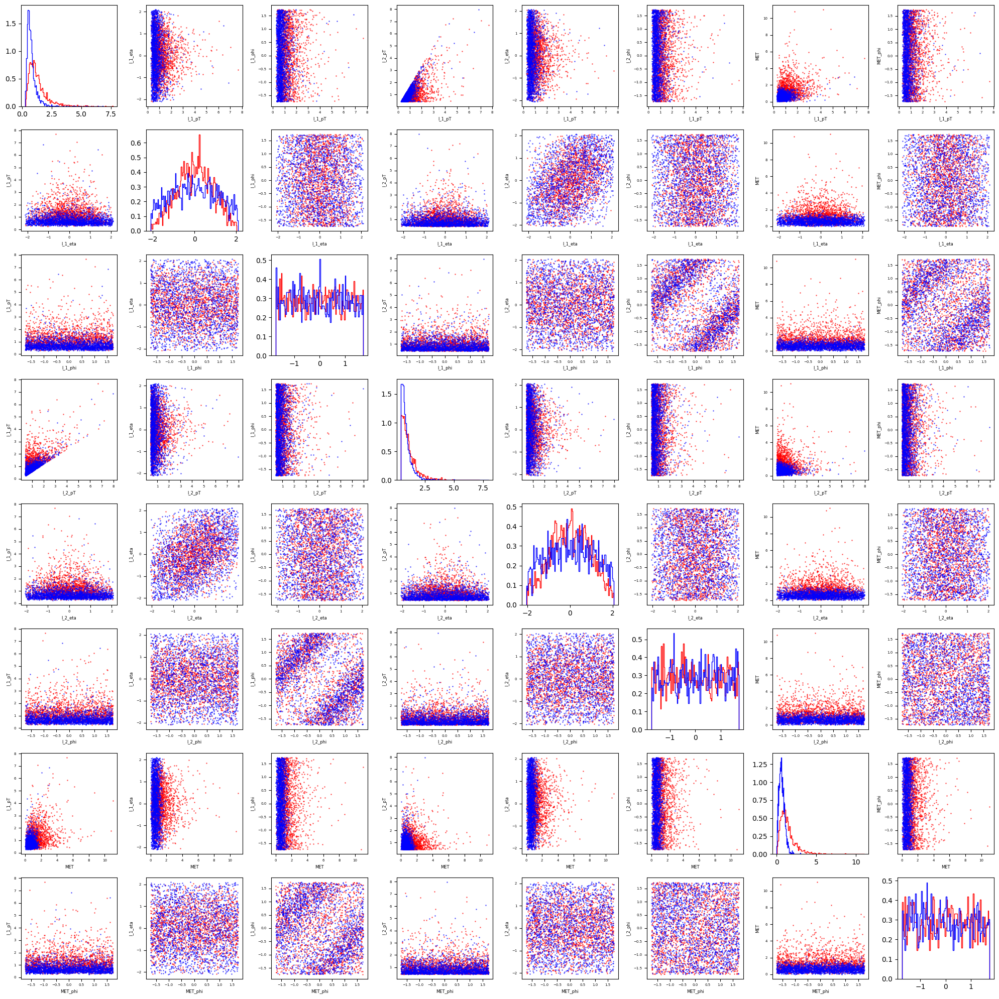

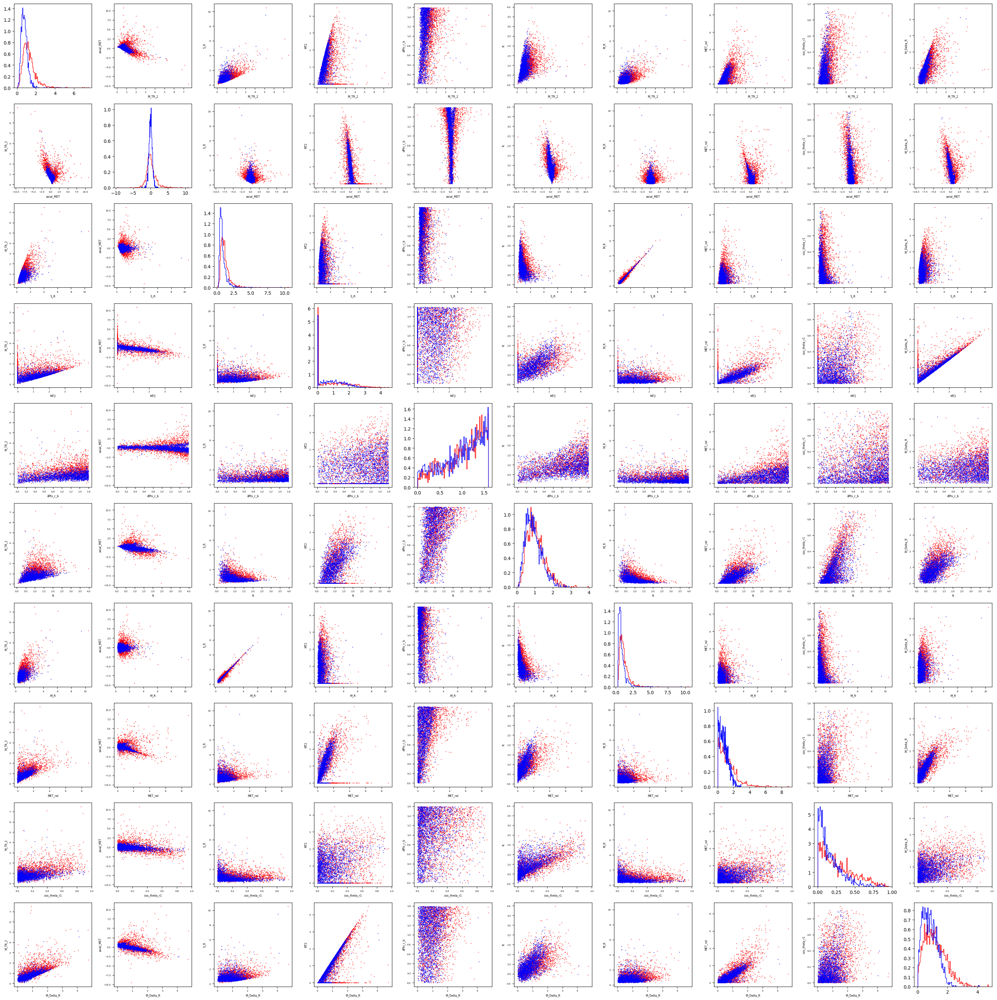

In [35]:
#part B - sample 2000 events from signal and background to make plotting faster as all 500k not required for trends

idx_sig = np.random.choice(len(df_sig), size=2000, replace=False)
idx_bkg = np.random.choice(len(df_bkg), size=2000, replace=False)
df_sig_sample = df_sig.iloc[idx_sig]
df_bkg_sample = df_bkg.iloc[idx_bkg]

fig, axs = plt.subplots(8, 8, figsize=(20, 20))
for i, feat1 in enumerate(RawNames):
    for j, feat2 in enumerate(RawNames):
        ax = axs[i][j]
        if i == j:
            ax.hist(np.array(df_sig_sample[feat1]), bins=100, density=1, histtype="step", color="red", label="signal")
            ax.hist(np.array(df_bkg_sample[feat1]), bins=100, density=1, histtype="step", color="blue", label="background")
        else:
            ax.scatter(df_sig_sample[feat1], df_sig_sample[feat2], color="red", label="signal", alpha=0.5, s=1)
            ax.scatter(df_bkg_sample[feat1], df_bkg_sample[feat2], color="blue", label="background", alpha=0.5, s=1)
            ax.set_xlabel(feat1, fontsize=6)
            ax.set_ylabel(feat2, fontsize=6)
            ax.tick_params(labelsize=5)
plt.tight_layout()
plt.show()

#for FeatureNames:
fig, axs = plt.subplots(10, 10, figsize=(30, 30))
for i, feat1 in enumerate(FeatureNames):
    for j, feat2 in enumerate(FeatureNames):
        ax = axs[i][j]
        if i == j:
            ax.hist(np.array(df_sig_sample[feat1]), bins=100, density=1, histtype="step", color="red", label="signal")
            ax.hist(np.array(df_bkg_sample[feat1]), bins=100, density=1, histtype="step", color="blue", label="background")
        else:
            ax.scatter(df_sig_sample[feat1], df_sig_sample[feat2], color="red", label="signal", alpha=0.5, s=1)
            ax.scatter(df_bkg_sample[feat1], df_bkg_sample[feat2], color="blue", label="background", alpha=0.5, s=1)
            ax.set_xlabel(feat1, fontsize=6)
            ax.set_ylabel(feat2, fontsize=6)
            ax.tick_params(labelsize=5)
plt.tight_layout()
plt.show()

part c:

The high‑level engineered features provide the best separation between signal and background.
In particular, mT, mT2, invariant‑mass variables, and angular separation variables show the clearest visual separation in the pair plots.
Among low‑level features, MET and high‑pT objects show moderate separation, while η and φ show very little discrimination.

### Exercise 4.2

#### Part a
Install [tabulate](https://github.com/astanin/python-tabulate). 

#### Part b
Use numpy to compute the [covariance matrix](https://numpy.org/doc/stable/reference/generated/numpy.cov.html) and [correlation matrix](https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html) between all observabes, and separately between low and high-level features.

#### Part c
Use tabulate to create a well formatted table of the covariance and correlation matrices, with nice headings and appropriate significant figures. Embed the table into this notebook.

#### Part d
Write a function that takes a dataset and appropriate arguments and performs steps b and c.  

Hint: Example code for embedding a `tabulate` table into a notebook:

In [37]:
from IPython.display import HTML, display
import tabulate
table = [["A",1,2],
        ["C",3,4],
        ["D",5,6]]
display(HTML(tabulate.tabulate(table, tablefmt='html', headers=["X","Y","Z"])))

X,Y,Z
A,1,2
C,3,4
D,5,6


In [41]:
# part b
import numpy as np

# Full dataset
X = df[RawNames + FeatureNames].to_numpy()

# Low-level features only
X_low = df[RawNames].to_numpy()

# High-level features only
X_high = df[FeatureNames].to_numpy()


# Covariance matrices
cov_all  = np.cov(X, rowvar=False)
cov_low  = np.cov(X_low, rowvar=False)
cov_high = np.cov(X_high, rowvar=False)

# Correlation matrices
corr_all  = np.corrcoef(X, rowvar=False)
corr_low  = np.corrcoef(X_low, rowvar=False)
corr_high = np.corrcoef(X_high, rowvar=False)


In [43]:
# part c

from tabulate import tabulate
from IPython.display import HTML, display

def show_matrix_html(matrix, feature_names, title):
    html_table = tabulate(
        matrix,
        headers=feature_names,
        showindex=feature_names,
        tablefmt="html",
        floatfmt=".3f"
    )
    display(HTML(f"<h3>{title}</h3>" + html_table))
# Show covariance matrices
show_matrix_html(cov_all, RawNames + FeatureNames, "Covariance Matrix (All Features)")
show_matrix_html(corr_all, RawNames + FeatureNames, "Correlation Matrix (All Features)")

,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,M_TR_2,axial_MET,S_R,MT2,dPhi_r_b,R,M_R,MET_rel,cos_theta_r1,M_Delta_R
l_1_pT,0.467,-0.000,0.000,0.305,-0.000,0.001,0.228,-0.001,0.287,-0.010,0.343,-0.012,-0.047,-0.060,0.364,0.098,0.022,0.098
l_1_eta,-0.000,1.004,-0.001,-0.000,0.408,-0.001,-0.002,-0.001,-0.001,-0.001,-0.001,0.000,-0.001,0.000,-0.001,-0.001,0.000,-0.001
l_1_phi,0.000,-0.001,1.004,0.001,0.000,-0.267,0.001,-0.185,0.001,-0.002,0.001,0.001,0.001,0.000,0.001,0.001,0.000,0.001
l_2_pT,0.305,-0.000,0.001,0.425,-0.001,0.000,0.079,-0.002,0.163,0.051,0.322,-0.069,-0.004,-0.099,0.325,-0.001,-0.028,0.006
l_2_eta,-0.000,0.408,0.000,-0.001,1.006,0.000,0.000,-0.000,0.000,-0.001,-0.001,0.001,-0.000,0.000,-0.001,0.001,0.000,0.001
l_2_phi,0.001,-0.001,-0.267,0.000,0.000,1.004,-0.000,-0.035,0.001,-0.002,0.001,0.002,-0.000,0.001,0.001,0.001,0.000,0.001
MET,0.228,-0.002,0.001,0.079,0.000,-0.000,0.762,-0.003,0.365,0.154,0.166,0.155,0.146,0.188,0.145,0.546,0.073,0.315
MET_phi,-0.001,-0.001,-0.185,-0.002,-0.000,-0.035,-0.003,1.003,-0.001,-0.000,-0.002,0.000,-0.002,-0.000,-0.001,-0.005,0.000,-0.001
M_TR_2,0.287,-0.001,0.001,0.163,0.000,0.001,0.365,-0.001,0.338,-0.185,0.228,0.189,0.058,0.104,0.210,0.302,0.052,0.242
axial_MET,-0.010,-0.001,-0.002,0.051,-0.001,-0.002,0.154,-0.000,-0.185,1.005,-0.041,-0.461,-0.025,-0.181,0.017,-0.120,-0.054,-0.233


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,M_TR_2,axial_MET,S_R,MT2,dPhi_r_b,R,M_R,MET_rel,cos_theta_r1,M_Delta_R
l_1_pT,1.000,-0.001,0.000,0.684,-0.001,0.001,0.383,-0.001,0.723,-0.014,0.811,-0.021,-0.157,-0.186,0.851,0.160,0.165,0.229
l_1_eta,-0.001,1.000,-0.001,-0.000,0.406,-0.001,-0.002,-0.001,-0.001,-0.001,-0.001,0.000,-0.002,0.001,-0.001,-0.002,0.002,-0.002
l_1_phi,0.000,-0.001,1.000,0.002,0.000,-0.266,0.001,-0.184,0.001,-0.002,0.002,0.001,0.002,0.000,0.002,0.001,0.001,0.001
l_2_pT,0.684,-0.000,0.002,1.000,-0.001,0.000,0.140,-0.002,0.430,0.078,0.799,-0.123,-0.013,-0.324,0.797,-0.001,-0.217,0.014
l_2_eta,-0.001,0.406,0.000,-0.001,1.000,0.000,0.000,-0.000,0.000,-0.001,-0.001,0.002,-0.001,0.001,-0.001,0.001,0.001,0.001
l_2_phi,0.001,-0.001,-0.266,0.000,0.000,1.000,-0.000,-0.035,0.001,-0.002,0.001,0.003,-0.001,0.001,0.001,0.002,0.000,0.002
MET,0.383,-0.002,0.001,0.140,0.000,-0.000,1.000,-0.003,0.720,0.176,0.307,0.206,0.383,0.457,0.264,0.704,0.425,0.579
MET_phi,-0.001,-0.001,-0.184,-0.002,-0.000,-0.035,-0.003,1.000,-0.002,-0.000,-0.003,0.000,-0.004,-0.000,-0.002,-0.005,0.001,-0.001
M_TR_2,0.723,-0.001,0.001,0.430,0.000,0.001,0.720,-0.002,1.000,-0.317,0.635,0.379,0.229,0.380,0.577,0.584,0.451,0.668
axial_MET,-0.014,-0.001,-0.002,0.078,-0.001,-0.002,0.176,-0.000,-0.317,1.000,-0.067,-0.535,-0.057,-0.383,0.027,-0.134,-0.272,-0.373


In [44]:
# part d:

def compute_and_display_stats(X, feature_names, title_prefix="Dataset"):
    cov = np.cov(X, rowvar=False)
    corr = np.corrcoef(X, rowvar=False)

    show_matrix_html(cov, feature_names, f"{title_prefix}: Covariance Matrix")
    show_matrix_html(corr, feature_names, f"{title_prefix}: Correlation Matrix")

# Compute and display stats for full dataset, low-level features, and high-level features
compute_and_display_stats(X, RawNames + FeatureNames, "All Features")
compute_and_display_stats(X_low, RawNames, "Low-Level Features")
compute_and_display_stats(X_high, FeatureNames, "High-Level Features")


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,M_TR_2,axial_MET,S_R,MT2,dPhi_r_b,R,M_R,MET_rel,cos_theta_r1,M_Delta_R
l_1_pT,0.467,-0.000,0.000,0.305,-0.000,0.001,0.228,-0.001,0.287,-0.010,0.343,-0.012,-0.047,-0.060,0.364,0.098,0.022,0.098
l_1_eta,-0.000,1.004,-0.001,-0.000,0.408,-0.001,-0.002,-0.001,-0.001,-0.001,-0.001,0.000,-0.001,0.000,-0.001,-0.001,0.000,-0.001
l_1_phi,0.000,-0.001,1.004,0.001,0.000,-0.267,0.001,-0.185,0.001,-0.002,0.001,0.001,0.001,0.000,0.001,0.001,0.000,0.001
l_2_pT,0.305,-0.000,0.001,0.425,-0.001,0.000,0.079,-0.002,0.163,0.051,0.322,-0.069,-0.004,-0.099,0.325,-0.001,-0.028,0.006
l_2_eta,-0.000,0.408,0.000,-0.001,1.006,0.000,0.000,-0.000,0.000,-0.001,-0.001,0.001,-0.000,0.000,-0.001,0.001,0.000,0.001
l_2_phi,0.001,-0.001,-0.267,0.000,0.000,1.004,-0.000,-0.035,0.001,-0.002,0.001,0.002,-0.000,0.001,0.001,0.001,0.000,0.001
MET,0.228,-0.002,0.001,0.079,0.000,-0.000,0.762,-0.003,0.365,0.154,0.166,0.155,0.146,0.188,0.145,0.546,0.073,0.315
MET_phi,-0.001,-0.001,-0.185,-0.002,-0.000,-0.035,-0.003,1.003,-0.001,-0.000,-0.002,0.000,-0.002,-0.000,-0.001,-0.005,0.000,-0.001
M_TR_2,0.287,-0.001,0.001,0.163,0.000,0.001,0.365,-0.001,0.338,-0.185,0.228,0.189,0.058,0.104,0.210,0.302,0.052,0.242
axial_MET,-0.010,-0.001,-0.002,0.051,-0.001,-0.002,0.154,-0.000,-0.185,1.005,-0.041,-0.461,-0.025,-0.181,0.017,-0.120,-0.054,-0.233


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,M_TR_2,axial_MET,S_R,MT2,dPhi_r_b,R,M_R,MET_rel,cos_theta_r1,M_Delta_R
l_1_pT,1.000,-0.001,0.000,0.684,-0.001,0.001,0.383,-0.001,0.723,-0.014,0.811,-0.021,-0.157,-0.186,0.851,0.160,0.165,0.229
l_1_eta,-0.001,1.000,-0.001,-0.000,0.406,-0.001,-0.002,-0.001,-0.001,-0.001,-0.001,0.000,-0.002,0.001,-0.001,-0.002,0.002,-0.002
l_1_phi,0.000,-0.001,1.000,0.002,0.000,-0.266,0.001,-0.184,0.001,-0.002,0.002,0.001,0.002,0.000,0.002,0.001,0.001,0.001
l_2_pT,0.684,-0.000,0.002,1.000,-0.001,0.000,0.140,-0.002,0.430,0.078,0.799,-0.123,-0.013,-0.324,0.797,-0.001,-0.217,0.014
l_2_eta,-0.001,0.406,0.000,-0.001,1.000,0.000,0.000,-0.000,0.000,-0.001,-0.001,0.002,-0.001,0.001,-0.001,0.001,0.001,0.001
l_2_phi,0.001,-0.001,-0.266,0.000,0.000,1.000,-0.000,-0.035,0.001,-0.002,0.001,0.003,-0.001,0.001,0.001,0.002,0.000,0.002
MET,0.383,-0.002,0.001,0.140,0.000,-0.000,1.000,-0.003,0.720,0.176,0.307,0.206,0.383,0.457,0.264,0.704,0.425,0.579
MET_phi,-0.001,-0.001,-0.184,-0.002,-0.000,-0.035,-0.003,1.000,-0.002,-0.000,-0.003,0.000,-0.004,-0.000,-0.002,-0.005,0.001,-0.001
M_TR_2,0.723,-0.001,0.001,0.430,0.000,0.001,0.720,-0.002,1.000,-0.317,0.635,0.379,0.229,0.380,0.577,0.584,0.451,0.668
axial_MET,-0.014,-0.001,-0.002,0.078,-0.001,-0.002,0.176,-0.000,-0.317,1.000,-0.067,-0.535,-0.057,-0.383,0.027,-0.134,-0.272,-0.373


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi
l_1_pT,0.467,-0.000,0.000,0.305,-0.000,0.001,0.228,-0.001
l_1_eta,-0.000,1.004,-0.001,-0.000,0.408,-0.001,-0.002,-0.001
l_1_phi,0.000,-0.001,1.004,0.001,0.000,-0.267,0.001,-0.185
l_2_pT,0.305,-0.000,0.001,0.425,-0.001,0.000,0.079,-0.002
l_2_eta,-0.000,0.408,0.000,-0.001,1.006,0.000,0.000,-0.000
l_2_phi,0.001,-0.001,-0.267,0.000,0.000,1.004,-0.000,-0.035
MET,0.228,-0.002,0.001,0.079,0.000,-0.000,0.762,-0.003
MET_phi,-0.001,-0.001,-0.185,-0.002,-0.000,-0.035,-0.003,1.003


,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi
l_1_pT,1.000,-0.001,0.000,0.684,-0.001,0.001,0.383,-0.001
l_1_eta,-0.001,1.000,-0.001,-0.000,0.406,-0.001,-0.002,-0.001
l_1_phi,0.000,-0.001,1.000,0.002,0.000,-0.266,0.001,-0.184
l_2_pT,0.684,-0.000,0.002,1.000,-0.001,0.000,0.140,-0.002
l_2_eta,-0.001,0.406,0.000,-0.001,1.000,0.000,0.000,-0.000
l_2_phi,0.001,-0.001,-0.266,0.000,0.000,1.000,-0.000,-0.035
MET,0.383,-0.002,0.001,0.140,0.000,-0.000,1.000,-0.003
MET_phi,-0.001,-0.001,-0.184,-0.002,-0.000,-0.035,-0.003,1.000


,M_TR_2,axial_MET,S_R,MT2,dPhi_r_b,R,M_R,MET_rel,cos_theta_r1,M_Delta_R
M_TR_2,0.338,-0.185,0.228,0.189,0.058,0.104,0.210,0.302,0.052,0.242
axial_MET,-0.185,1.005,-0.041,-0.461,-0.025,-0.181,0.017,-0.120,-0.054,-0.233
S_R,0.228,-0.041,0.382,-0.011,-0.003,-0.083,0.380,0.082,-0.010,0.096
MT2,0.189,-0.461,-0.011,0.738,0.021,0.232,-0.037,0.409,0.045,0.433
dPhi_r_b,0.058,-0.025,-0.003,0.021,0.190,0.087,-0.029,0.146,0.009,0.042
R,0.104,-0.181,-0.083,0.232,0.087,0.222,-0.113,0.249,0.058,0.165
M_R,0.210,0.017,0.380,-0.037,-0.029,-0.113,0.392,0.044,-0.014,0.074
MET_rel,0.302,-0.120,0.082,0.409,0.146,0.249,0.044,0.790,0.055,0.415
cos_theta_r1,0.052,-0.054,-0.010,0.045,0.009,0.058,-0.014,0.055,0.039,0.039
M_Delta_R,0.242,-0.233,0.096,0.433,0.042,0.165,0.074,0.415,0.039,0.389


,M_TR_2,axial_MET,S_R,MT2,dPhi_r_b,R,M_R,MET_rel,cos_theta_r1,M_Delta_R
M_TR_2,1.000,-0.317,0.635,0.379,0.229,0.380,0.577,0.584,0.451,0.668
axial_MET,-0.317,1.000,-0.067,-0.535,-0.057,-0.383,0.027,-0.134,-0.272,-0.373
S_R,0.635,-0.067,1.000,-0.021,-0.013,-0.287,0.981,0.150,-0.085,0.249
MT2,0.379,-0.535,-0.021,1.000,0.056,0.574,-0.068,0.535,0.264,0.809
dPhi_r_b,0.229,-0.057,-0.013,0.056,1.000,0.424,-0.106,0.378,0.106,0.155
R,0.380,-0.383,-0.287,0.574,0.424,1.000,-0.383,0.595,0.627,0.564
M_R,0.577,0.027,0.981,-0.068,-0.106,-0.383,1.000,0.078,-0.116,0.189
MET_rel,0.584,-0.134,0.150,0.535,0.378,0.595,0.078,1.000,0.316,0.748
cos_theta_r1,0.451,-0.272,-0.085,0.264,0.106,0.627,-0.116,0.316,1.000,0.319
M_Delta_R,0.668,-0.373,0.249,0.809,0.155,0.564,0.189,0.748,0.319,1.000


## Exercise 5: Selection

### Exercise 5.1

Part a
By looking at the signal/background distributions for each observable (e.g. $x$) determine which selection criteria would be optimal: 

1. $x > x_c$
2. $x < x_c$
3. $|x - \mu| > x_c$
4. $|x - \mu| < x_c$

where $x_c$ is value to be determined below.

### Exercise 5.2

Plot the True Positive Rate (TPR) (aka signal efficiency $\epsilon_S(x_c)$) and False Positive Rate (FPR) (aka background efficiency $\epsilon_B(x_c)$) as function of $x_c$ for applying the strategy in part a to each observable. 

### Exercise 5.3
Assume 3 different scenarios corresponding to different numbers of signal and background events expected in data:

1. Expect $N_S=10$, $N_B=100$.
1. Expect $N_S=100$, $N_B=1000$.
1. Expect $N_S=1000$, $N_B=10000$.
1. Expect $N_S=10000$, $N_B=100000$.

Plot the significance ($\sigma_{S'}$) for each observable as function of $x_c$ for each scenario, where 

$\sigma_{S'}= \frac{N'_S}{\sqrt{N'_S+N'_B}}$

and $N'_{S,B} = \epsilon_{S,B}(x_c) * N_{S,B}$.

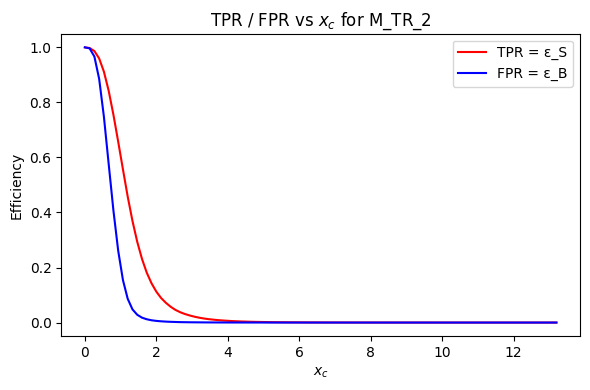

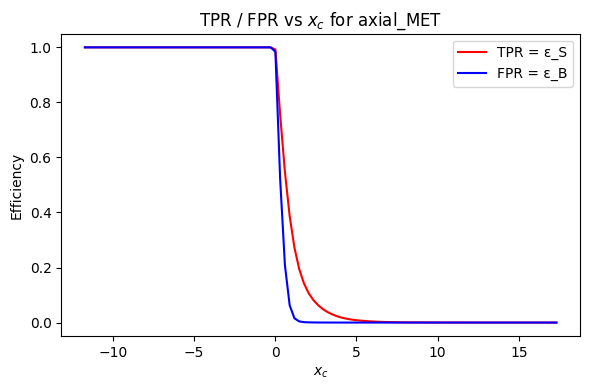

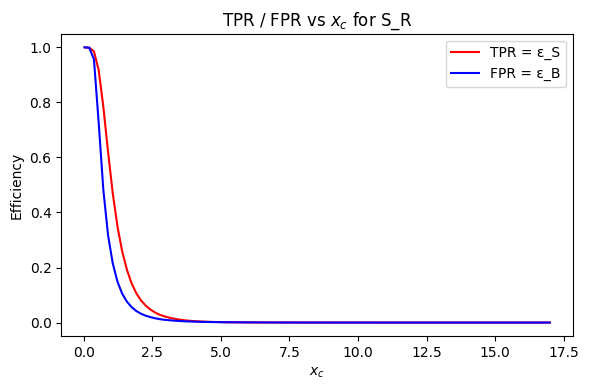

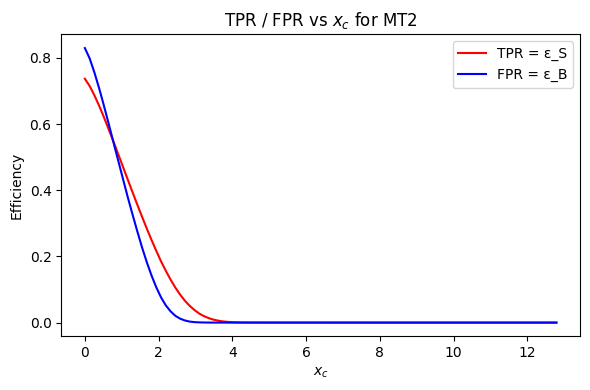

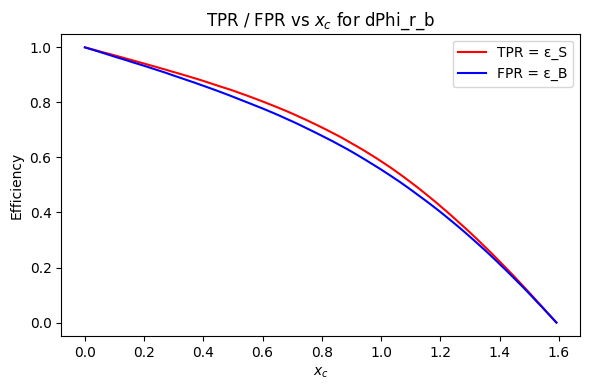

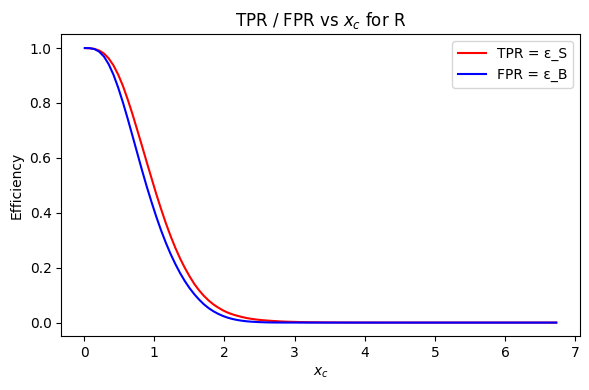

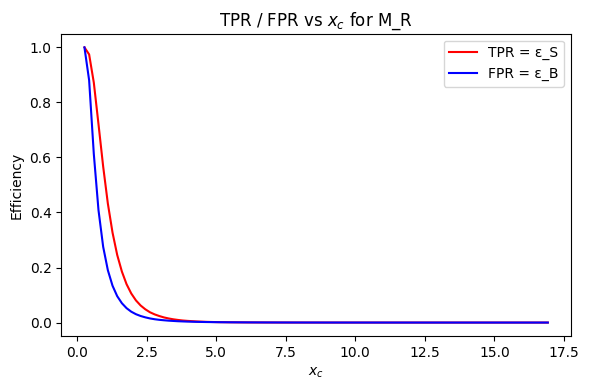

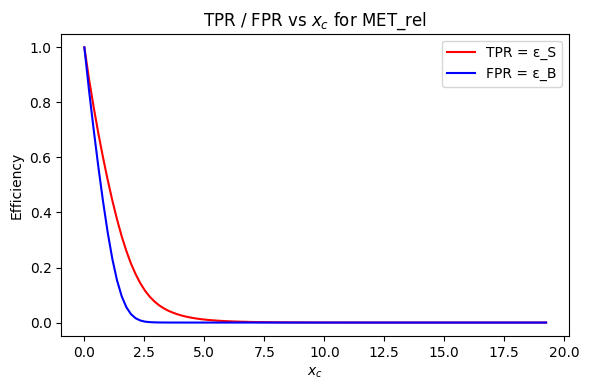

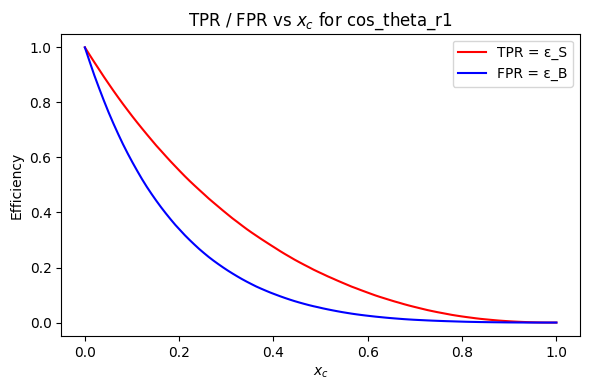

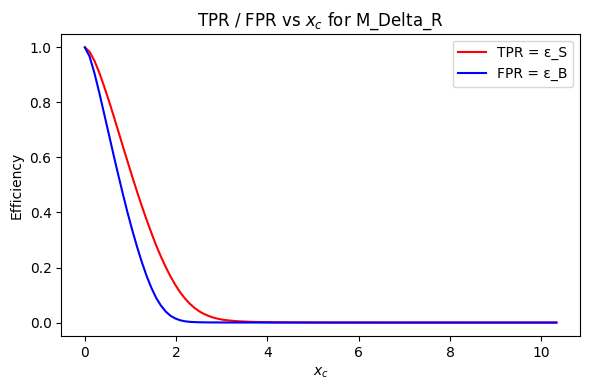

In [51]:
import numpy as np

#decided which features to cut on and the strategy for each (>, <, |<|, |>|, None) from 5.1
strategies = {
    "l_1_phi": None,
    "l_1_pT": "<",
    "l_1_eta": "|<|",
    "l_2_pT": ">",
    "l_2_eta": "|<|",
    "l_2_phi": None,
    "MET": ">",
    "MET_phi": None,
    "MET_rel": ">",
    "axial_MET": "|>|",
    "M_R": ">",
    "M_TR_2": ">",
    "R": ">",
    "MT2": ">",
    "S_R": ">",
    "M_Delta_R": ">",
    "dPhi_r_b": ">",
    "cos_theta_r1": ">"
}


# Split into signal and background
df_sig = df[df["signal"] == 1]
df_bkg = df[df["signal"] == 0]

# Convert to numpy arrays
X_sig = df_sig[FeatureNames].to_numpy()
X_bkg = df_bkg[FeatureNames].to_numpy()


def compute_efficiencies_1d(x_sig, x_bkg, strategy, n_thresholds=100):
    # thresholds scanned over the full range of the variable
    x_min = min(x_sig.min(), x_bkg.min())
    x_max = max(x_sig.max(), x_bkg.max())
    thresholds = np.linspace(x_min, x_max, n_thresholds)

    eps_s = np.zeros_like(thresholds)
    eps_b = np.zeros_like(thresholds)

    mu = 0.0
    if strategy in ["|<|", "|>|"]:
        mu = 0.5 * (x_sig.mean() + x_bkg.mean())

    for i, xc in enumerate(thresholds):
        if strategy == ">":
            mask_s = x_sig > xc
            mask_b = x_bkg > xc
        elif strategy == "<":
            mask_s = x_sig < xc
            mask_b = x_bkg < xc
        elif strategy == "|<|":
            mask_s = np.abs(x_sig - mu) < xc
            mask_b = np.abs(x_bkg - mu) < xc
        elif strategy == "|>|":
            mask_s = np.abs(x_sig - mu) > xc
            mask_b = np.abs(x_bkg - mu) > xc
        else:
            raise ValueError(f"Unknown strategy {strategy}")

        eps_s[i] = mask_s.mean()
        eps_b[i] = mask_b.mean()

    return thresholds, eps_s, eps_b

import matplotlib.pyplot as plt

def plot_tpr_fpr_for_feature(idx, feature_name, strategy):
    x_sig = X_sig[:, idx]
    x_bkg = X_bkg[:, idx]

    thresholds, eps_s, eps_b = compute_efficiencies_1d(x_sig, x_bkg, strategy)

    plt.figure(figsize=(6,4))
    plt.plot(thresholds, eps_s, label="TPR = ε_S", color="red")
    plt.plot(thresholds, eps_b, label="FPR = ε_B", color="blue")
    plt.xlabel(r"$x_c$")
    plt.ylabel("Efficiency")
    plt.title(f"TPR / FPR vs $x_c$ for {feature_name}")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return thresholds, eps_s, eps_b

#usage for all features
for i, name in enumerate(FeatureNames):
    strat = strategies.get(name, None)
    if strat is None:
        continue  # skip features with "no cut"
    thresholds, eps_s, eps_b = plot_tpr_fpr_for_feature(i, name, strat)


5.1

### **l₁_phi**  
No useful separation - distributions identical → no cut.

### **l₂_pT**  
Use **x > x_c** - signal slightly enriched at higher pT.

### **l₂_eta**  
Use **|x − μ| < x_c** - signal concentrated near η ≈ 0.

### **l₂_phi**  
No useful separation - distributions flat and identical.

### **MET**  
Use **x > x_c** - signal has a longer high‑MET tail.

### **MET_phi**  
No useful separation - uniform for both classes.

### **MET_rel**  
Use **x > x_c** - signal shifted slightly to higher values.

### **axial_MET**  
Use **|x − μ| > x_c** - signal broader, background sharply peaked at 0.

### **M_R**  
Use **x > x_c** - signal slightly shifted to higher values.

### **M_TR_2**  
Use **x > x_c** - same right‑shift pattern as M_R.

### **R**  
Use **x > x_c** - weak but signal slightly higher at larger R.

### **MT2**  
Use **x > x_c** - background peaks at 0, signal extends further.

### **S_R**  
Use **x > x_c** - signal shifted to higher values.

### **M_Delta_R**  
Use **x > x_c** - signal slightly more in the right tail.

### **dPhi_r_b**  
Use **x > x_c** - signal consistently above background across range.

### **cos_theta_r1**  
Use **x > x_c** - background concentrated at low values, signal falls slower.


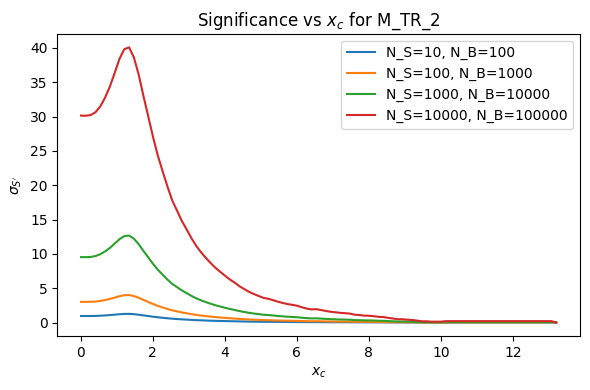

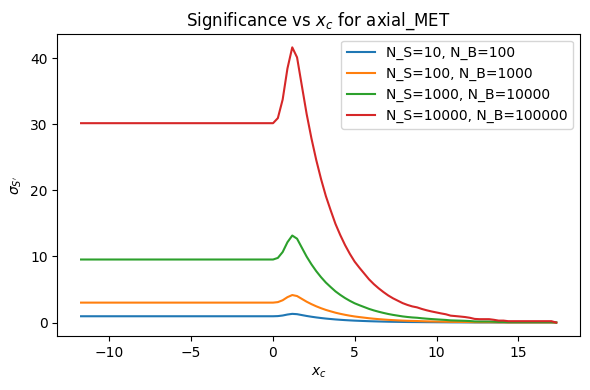

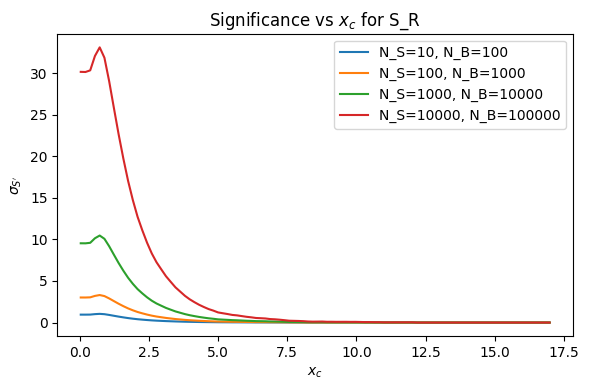

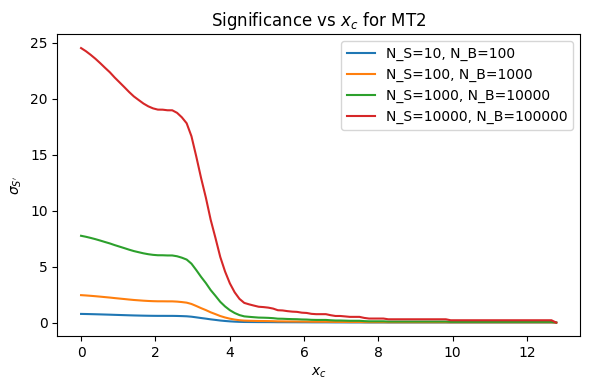

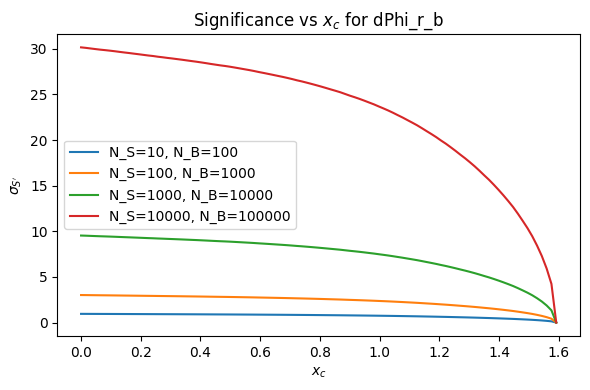

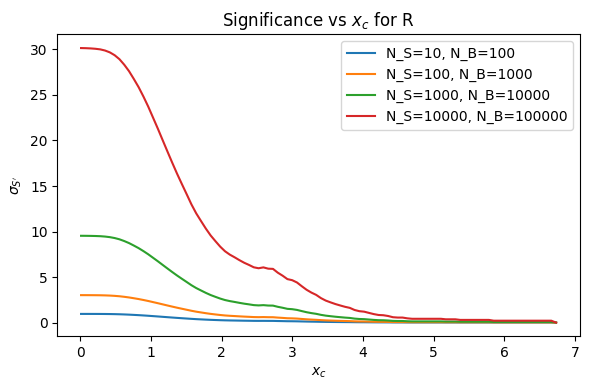

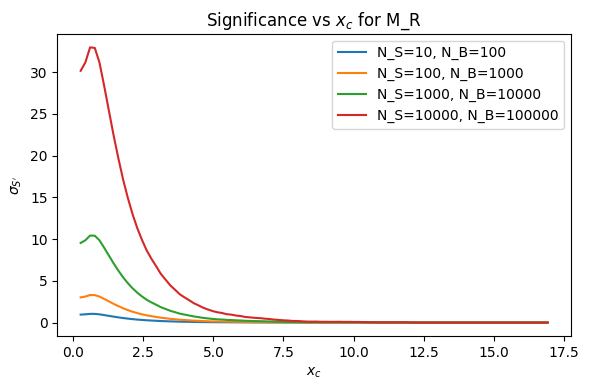

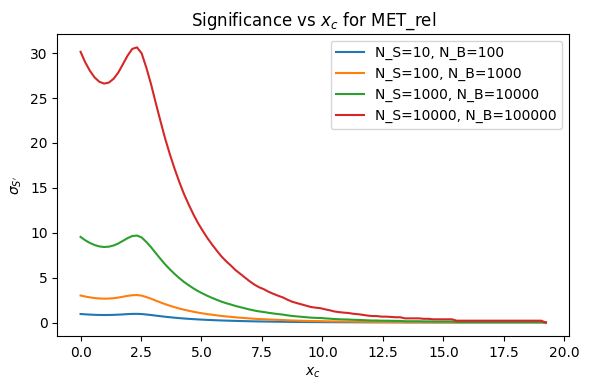

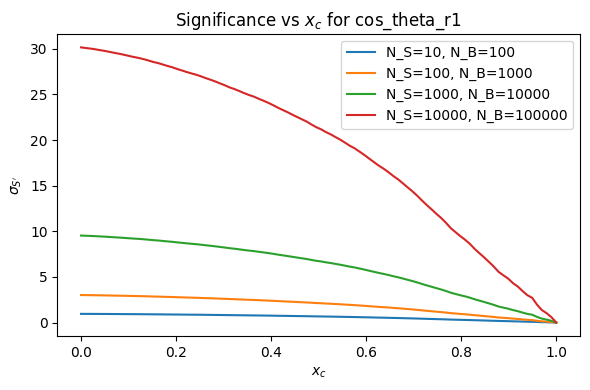

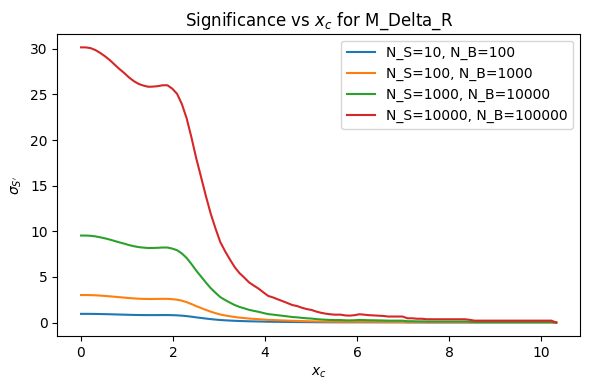

In [53]:
#5.3

scenarios = [
    (10, 100),
    (100, 1000),
    (1000, 10000),
    (10000, 100000),
]

def compute_significance(eps_s, eps_b, N_S, N_B):
    Np_S = eps_s * N_S
    Np_B = eps_b * N_B
    denom = np.sqrt(Np_S + Np_B)
    sigma = np.zeros_like(denom)
    nonzero = denom > 0
    sigma[nonzero] = Np_S[nonzero] / denom[nonzero]
    return sigma

def plot_significance_for_feature(idx, feature_name, strategy):
    x_sig = X_sig[:, idx]
    x_bkg = X_bkg[:, idx]

    thresholds, eps_s, eps_b = compute_efficiencies_1d(x_sig, x_bkg, strategy)

    plt.figure(figsize=(6,4))
    for N_S, N_B in scenarios:
        sigma = compute_significance(eps_s, eps_b, N_S, N_B)
        label = f"N_S={N_S}, N_B={N_B}"
        plt.plot(thresholds, sigma, label=label)

    plt.xlabel(r"$x_c$")
    plt.ylabel(r"$\sigma_{S'}$")
    plt.title(f"Significance vs $x_c$ for {feature_name}")
    plt.legend()
    plt.tight_layout()
    plt.show()

for i, name in enumerate(FeatureNames):
    strat = strategies.get(name, None)
    if strat is None:
        continue
    plot_significance_for_feature(i, name, strat)


## Exercise 6: Cut Flow


### Exercise 6.1

For each above scenario, choose a subset (minumum 3) of observables to use for selections, and values of $x_c$ based on your significance plots (part 3c). 

### Exercise 6.2
Create a "cut-flow" table for each scenario where you successively make the selections on each observable and tabulate $\epsilon_S$, $\epsilon_B$, $N'_S$, $N'_B$, and $\sigma_{S'}$.

### Exercise 6.3
In 3c above you computed the significance for each observable assuming to make no other selections on any other observable. If the variables are correlated, then this assumption can lead to non-optimial results when selecting on multiple variables. By looking at the correlation matrices and your answers to 4b, identify where this effect could be most detrimental to the significance. Attempt to correct the issue by applying the selection in one observable and then optimizing (part 3c) for a second observable. What happens if you change the order of your selection (make selection on second and optimize on first)?




6.1

For each scenario, we select the observables 
𝑀
TR
2
, 
𝑀
𝑇
2
, and 
𝑑
𝜙
𝑟
,
𝑏
.
For each observable, we choose the threshold 
𝑥
𝑐
 at (or near) the maximum of the significance curve from 5.3.
The optimal 
𝑥
𝑐
 values are approximately 
𝑥
𝑐
(
𝑀
TR
2
)
∼
0.5
, 
𝑥
𝑐
(
𝑀
𝑇
2
)
∼
0.5
, and 
𝑥
𝑐
(
𝑑
𝜙
)
∼
0.2
, and are essentially independent of 
(
𝑁
𝑆
,
𝑁
𝐵
)
.

In [55]:
import numpy as np
import pandas as pd

def apply_cut(x_values, strategy, xc, mu=0.0):
    """Return boolean mask of events passing the cut."""
    if strategy == ">":
        return x_values > xc
    elif strategy == "<":
        return x_values < xc
    elif strategy == "|<|":
        return np.abs(x_values - mu) < xc
    elif strategy == "|>|":
        return np.abs(x_values - mu) > xc
    else:
        raise ValueError("Unknown strategy")


def cutflow_table(chosen_features, chosen_xc, scenario):
    """
    chosen_features: list of feature names
    chosen_xc: dict {feature: xc_value}
    scenario: (N_S, N_B)
    """

    N_S, N_B = scenario

    # Start with full samples
    sig_mask = np.ones(len(X_sig), dtype=bool)
    bkg_mask = np.ones(len(X_bkg), dtype=bool)

    rows = []

    # Row 0: no cuts
    eps_S = 1.0
    eps_B = 1.0
    Np_S = N_S
    Np_B = N_B
    sigma = Np_S / np.sqrt(Np_S + Np_B)

    rows.append(["No cuts", eps_S, eps_B, Np_S, Np_B, sigma])

    # Apply cuts sequentially
    for feat in chosen_features:
        idx = FeatureNames.index(feat)
        strat = strategies[feat]
        xc = chosen_xc[feat]

        # Compute mu if needed
        if strat in ["|<|", "|>|"]:
            mu = 0.5 * (X_sig[:, idx].mean() + X_bkg[:, idx].mean())
        else:
            mu = 0.0

        # Apply cut to remaining events
        sig_mask = sig_mask & apply_cut(X_sig[:, idx], strat, xc, mu)
        bkg_mask = bkg_mask & apply_cut(X_bkg[:, idx], strat, xc, mu)

        # Efficiencies
        eps_S = sig_mask.mean()
        eps_B = bkg_mask.mean()

        # Updated yields
        Np_S = eps_S * N_S
        Np_B = eps_B * N_B

        # Significance
        sigma = Np_S / np.sqrt(Np_S + Np_B) if (Np_S + Np_B) > 0 else 0

        rows.append([feat, eps_S, eps_B, Np_S, Np_B, sigma])

    # Return as DataFrame
    return pd.DataFrame(rows, columns=["Cut", "ε_S", "ε_B", "N'_S", "N'_B", "σ_S'"])


chosen_features = ["M_TR_2", "MT2", "dPhi_r_b"]

chosen_xc = {
    "M_TR_2": 0.5,
    "MT2": 0.5,
    "dPhi_r_b": 0.2
}

for scenario in scenarios:
    print("\nScenario:", scenario)
    display(cutflow_table(chosen_features, chosen_xc, scenario))




Scenario: (10, 100)


,Cut,ε_S,ε_B,N'_S,N'_B,σ_S'
0,No cuts,1.000000,1.000000,10.000000,100.000000,0.953463
1,M_TR_2,0.929551,0.796573,9.295514,79.657255,0.985584
2,MT2,0.610364,0.613566,6.103645,61.356577,0.743131
3,dPhi_r_b,0.579271,0.583801,5.792711,58.380085,0.723113



Scenario: (100, 1000)


,Cut,ε_S,ε_B,N'_S,N'_B,σ_S'
0,No cuts,1.000000,1.000000,100.000000,1000.000000,3.015113
1,M_TR_2,0.929551,0.796573,92.955135,796.572547,3.116690
2,MT2,0.610364,0.613566,61.036446,613.565770,2.349986
3,dPhi_r_b,0.579271,0.583801,57.927109,583.800853,2.286685



Scenario: (1000, 10000)


,Cut,ε_S,ε_B,N'_S,N'_B,σ_S'
0,No cuts,1.000000,1.000000,1000.000000,10000.000000,9.534626
1,M_TR_2,0.929551,0.796573,929.551353,7965.725471,9.855840
2,MT2,0.610364,0.613566,610.364457,6135.657698,7.431310
3,dPhi_r_b,0.579271,0.583801,579.271086,5838.008532,7.231133



Scenario: (10000, 100000)


,Cut,ε_S,ε_B,N'_S,N'_B,σ_S'
0,No cuts,1.000000,1.000000,10000.000000,100000.000000,30.151134
1,M_TR_2,0.929551,0.796573,9295.513534,79657.254714,31.166903
2,MT2,0.610364,0.613566,6103.644572,61356.576979,23.499864
3,dPhi_r_b,0.579271,0.583801,5792.710855,58380.085317,22.866851


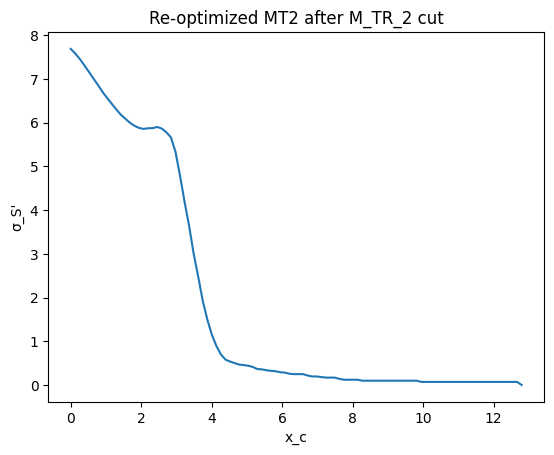

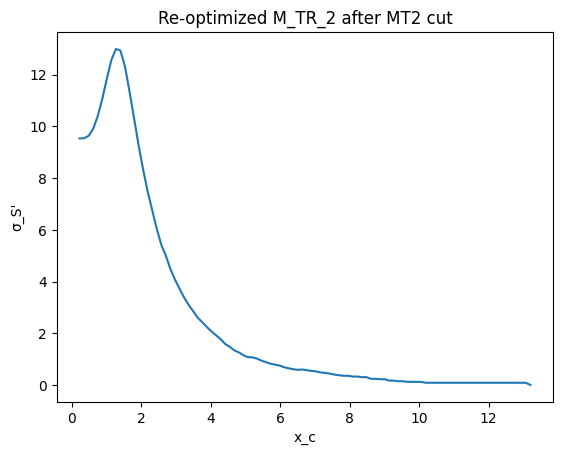

In [56]:
def optimize_after_first_cut(first_feat, first_xc, second_feat, strategy_second):
    """
    Re-optimize the second observable AFTER applying the first cut.
    Returns: thresholds, sigma_values
    """

    # Apply first cut
    idx1 = FeatureNames.index(first_feat)
    strat1 = strategies[first_feat]

    # Compute mu if needed
    if strat1 in ["|<|", "|>|"]:
        mu1 = 0.5 * (X_sig[:, idx1].mean() + X_bkg[:, idx1].mean())
    else:
        mu1 = 0.0

    sig_mask = apply_cut(X_sig[:, idx1], strat1, first_xc, mu1)
    bkg_mask = apply_cut(X_bkg[:, idx1], strat1, first_xc, mu1)

    # Extract remaining events
    x_sig_rem = X_sig[sig_mask, FeatureNames.index(second_feat)]
    x_bkg_rem = X_bkg[bkg_mask, FeatureNames.index(second_feat)]

    # Recompute efficiencies vs x_c for second variable
    thresholds, eps_s, eps_b = compute_efficiencies_1d(
        x_sig_rem, x_bkg_rem, strategy_second
    )

    # Compute significance for a chosen scenario (pick one)
    N_S, N_B = scenarios[2]  # e.g. (1000, 10000)
    sigma_vals = compute_significance(eps_s, eps_b, N_S, N_B)

    return thresholds, sigma_vals

thr, sig = optimize_after_first_cut("M_TR_2", 0.5, "MT2", ">")

plt.plot(thr, sig)
plt.title("Re-optimized MT2 after M_TR_2 cut")
plt.xlabel("x_c")
plt.ylabel("σ_S'")
plt.show()

thr2, sig2 = optimize_after_first_cut("MT2", 0.5, "M_TR_2", ">")

plt.plot(thr2, sig2)
plt.title("Re-optimized M_TR_2 after MT2 cut")
plt.xlabel("x_c")
plt.ylabel("σ_S'")
plt.show()



## Exercise 7: ROC Curves

### Exercise 7.1
For the top 3 observables you identified earlier, create one figure overlaying the Reciever Operating Characteristic (ROC) curves for the 3 observables. Compute the area under the curves and report it in the legend of the figure.

### Exercise 7.2
Write a function that you can use to quickly create the figure in part a with other observables and different conditions. Note that you will likely revise this function as you do the remainder of the lab.

### Exercise 7.3
Use the function from part b to compare the ROC curves for the successive selections in lab 3, exercise 4. Specifically, plot the ROC curve after each selection.

### Exercise 7.4
Use your function and appropriate example to demonstrate the effect (if any) of changing order of the successive selections.



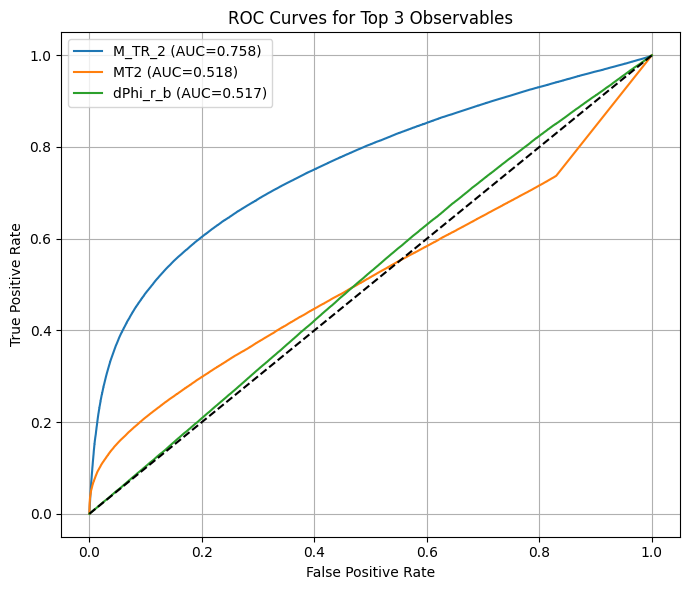

In [57]:
# 7.1

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

def roc_for_feature(feature):
    """
    Compute ROC curve and AUC for a single observable.
    Uses the raw feature values as the 'score'.
    """
    idx = FeatureNames.index(feature)

    # Scores = feature values
    scores_sig = X_sig[:, idx]
    scores_bkg = X_bkg[:, idx]

    # Build labels + scores
    y_true = np.concatenate([np.ones(len(scores_sig)), np.zeros(len(scores_bkg))])
    y_scores = np.concatenate([scores_sig, scores_bkg])

    # ROC curve
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)

    return fpr, tpr, roc_auc
# Example usage:
top3 = ["M_TR_2", "MT2", "dPhi_r_b"]

plt.figure(figsize=(7,6))

for feat in top3:
    fpr, tpr, roc_auc = roc_for_feature(feat)
    plt.plot(fpr, tpr, label=f"{feat} (AUC={roc_auc:.3f})")

plt.plot([0,1], [0,1], 'k--')  # diagonal reference
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for Top 3 Observables")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


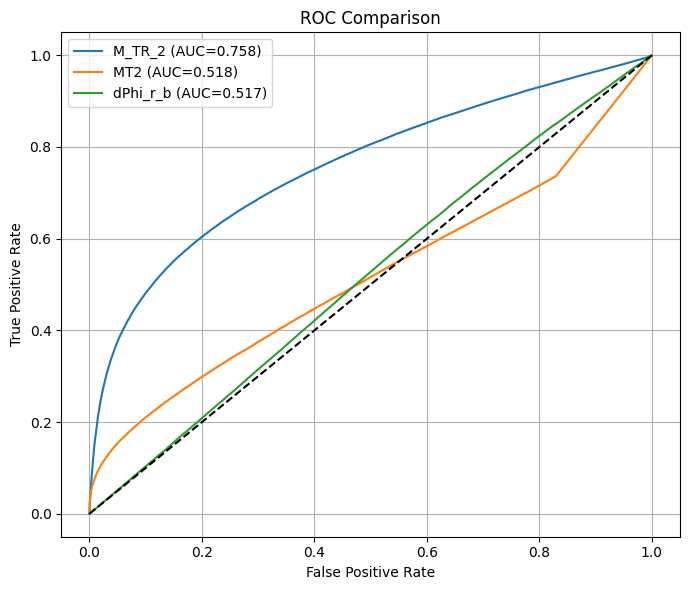

In [58]:
# 7.2
def plot_roc_set(features, title="ROC Comparison"):
    """
    Plot ROC curves for a list of observables.
    Computes AUC for each and includes it in the legend.
    """
    plt.figure(figsize=(7,6))

    for feat in features:
        fpr, tpr, roc_auc = roc_for_feature(feat)
        plt.plot(fpr, tpr, label=f"{feat} (AUC={roc_auc:.3f})")

    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_roc_set(["M_TR_2", "MT2", "dPhi_r_b"])


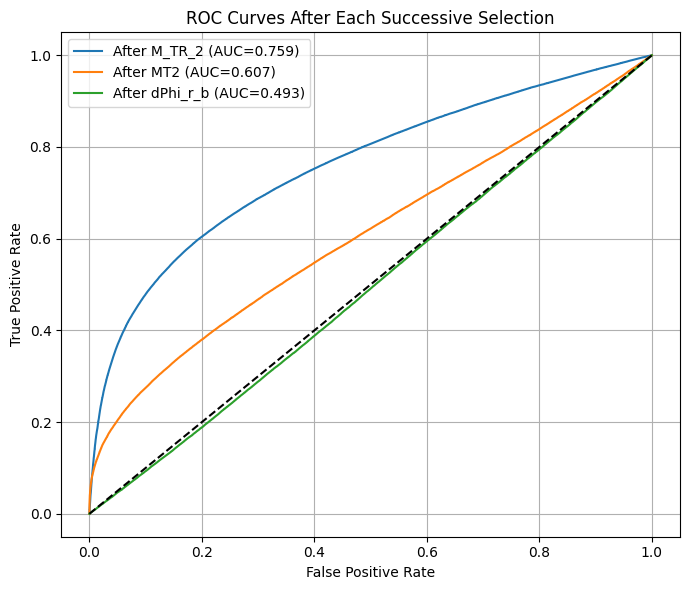

In [60]:
# 7.3
def roc_after_cuts(applied_cuts):
    """
    applied_cuts: list of (feature, xc) pairs applied sequentially.
    Returns: function that computes ROC on the remaining sample.
    """

    # Start with full masks
    sig_mask = np.ones(len(X_sig), dtype=bool)
    bkg_mask = np.ones(len(X_bkg), dtype=bool)

    # Apply each cut in order
    for feat, xc in applied_cuts:
        idx = FeatureNames.index(feat)
        strat = strategies[feat]

        # Compute mu if needed
        if strat in ["|<|", "|>|"]:
            mu = 0.5 * (X_sig[:, idx].mean() + X_bkg[:, idx].mean())
        else:
            mu = 0.0

        sig_mask &= apply_cut(X_sig[:, idx], strat, xc, mu)
        bkg_mask &= apply_cut(X_bkg[:, idx], strat, xc, mu)

    # Return masked samples
    return X_sig[sig_mask], X_bkg[bkg_mask]

#plot ROC for MT2 after applying M_TR_2 > 0.5 cut

cuts = [
    ("M_TR_2", 0.5),
    ("MT2", 0.5),
    ("dPhi_r_b", 0.2)
]

applied = []
plt.figure(figsize=(7,6))

for feat, xc in cuts:
    applied.append((feat, xc))

    # Remaining sample after these cuts
    Xs, Xb = roc_after_cuts(applied)

    # Use the next feature as the score
    idx = FeatureNames.index(feat)
    y_true = np.concatenate([np.ones(len(Xs)), np.zeros(len(Xb))])
    y_scores = np.concatenate([Xs[:, idx], Xb[:, idx]])

    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f"After {feat} (AUC={roc_auc:.3f})")

plt.plot([0,1], [0,1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves After Each Successive Selection")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




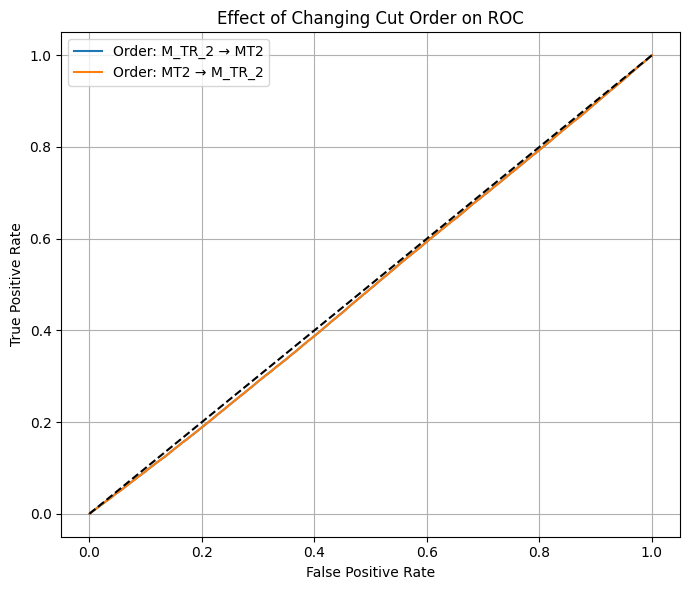

In [61]:
# 7.4 demonstrating effect of changing cut order

order1 = [("M_TR_2", 0.5), ("MT2", 0.5)]
order2 = [("MT2", 0.5), ("M_TR_2", 0.5)]

plt.figure(figsize=(7,6))

# Order 1
Xs1, Xb1 = roc_after_cuts(order1)
idx = FeatureNames.index("dPhi_r_b")
y_true = np.concatenate([np.ones(len(Xs1)), np.zeros(len(Xb1))])
y_scores = np.concatenate([Xs1[:, idx], Xb1[:, idx]])
fpr, tpr, _ = roc_curve(y_true, y_scores)
plt.plot(fpr, tpr, label="Order: M_TR_2 → MT2")

# Order 2
Xs2, Xb2 = roc_after_cuts(order2)
y_true = np.concatenate([np.ones(len(Xs2)), np.zeros(len(Xb2))])
y_scores = np.concatenate([Xs2[:, idx], Xb2[:, idx]])
fpr, tpr, _ = roc_curve(y_true, y_scores)
plt.plot(fpr, tpr, label="Order: MT2 → M_TR_2")

plt.plot([0,1], [0,1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Effect of Changing Cut Order on ROC")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Exercise 8: Linear Discriminant

### Exercise 8.1

Using numpy, compute the between-class $\bf{S}_B$ and within-class $\bf{S}_W$ covariance matrices defined as:

$$
\bf{S}_B = (\bf{m_2}-\bf{m_1})(\bf{m_2}-\bf{m_1})^T \\
$$
$$
\bf{S}_W = \sum_{i=1,2} \sum_{n=1}^{l_i} (\bf{x}_n^i - \bf{m}_i) (\bf{x}_n^i - \bf{m}_i)^T
$$

where $\bf{m_i}$ are the vectors containing the means for category 1 and 2, here defined as signal and background. Here $\bf{x}_n^i$ is the vector containing the observables for the $n$th example event in category $i$.

### Exercise 8.1

Compute the linear coefficients $\bf{w} = \bf{S_W}^{-1}(\bf{m_2}-\bf{m_1})$. Compare the histogram of the distribution of $F_n^i=\bf{w}^T\bf{x}_n^i$ for the two categories.

### Exercise 8.1

Draw the ROC curve for $F_n$. 

### Exercise 8.1

What is the maximal significance you can obtain in the scenarios in exercise 5? 

In [62]:
#8.1

import numpy as np

# Stack full dataset for convenience
X1 = X_sig          # class 1 = signal
X2 = X_bkg          # class 2 = background

# Means of each class (vectors of length = n_features)
m1 = X1.mean(axis=0)
m2 = X2.mean(axis=0)

# Between-class scatter matrix S_B
SB = np.outer(m2 - m1, m2 - m1)

# Within-class scatter matrix S_W
SW = np.zeros((len(FeatureNames), len(FeatureNames)))

# Add contributions from class 1
for x in X1:
    diff = (x - m1).reshape(-1, 1)
    SW += diff @ diff.T

# Add contributions from class 2
for x in X2:
    diff = (x - m2).reshape(-1, 1)
    SW += diff @ diff.T


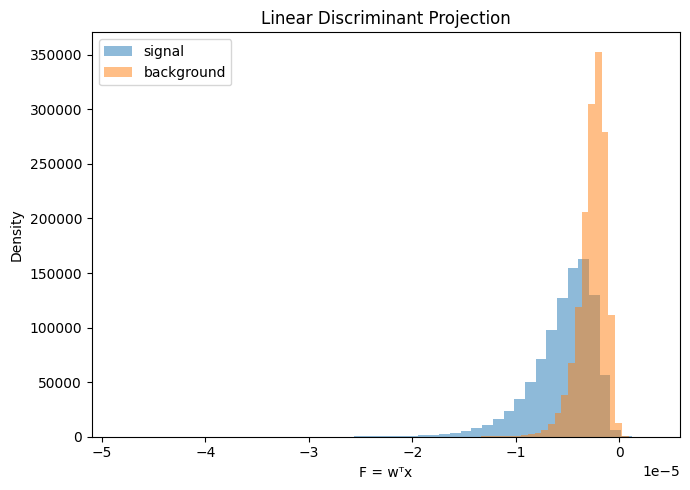

In [63]:
# 8.2

# Compute linear discriminant vector w = SW^{-1} (m2 - m1)
w = np.linalg.inv(SW) @ (m2 - m1)

# Project each event onto the discriminant direction
F_sig = X1 @ w
F_bkg = X2 @ w

# Plot histograms
import matplotlib.pyplot as plt

plt.figure(figsize=(7,5))
plt.hist(F_sig, bins=50, density=True, alpha=0.5, label="signal")
plt.hist(F_bkg, bins=50, density=True, alpha=0.5, label="background")
plt.xlabel("F = wᵀx")
plt.ylabel("Density")
plt.title("Linear Discriminant Projection")
plt.legend()
plt.tight_layout()
plt.show()


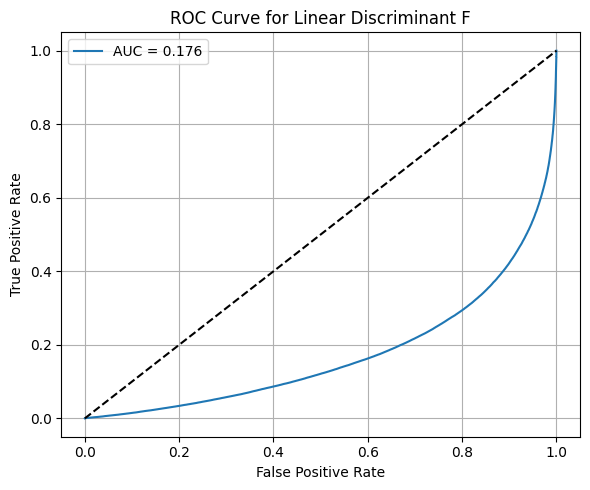

In [64]:
# 8.3

from sklearn.metrics import roc_curve, auc

# Build labels + scores
y_true = np.concatenate([np.ones(len(F_sig)), np.zeros(len(F_bkg))])
y_scores = np.concatenate([F_sig, F_bkg])

# ROC
fpr, tpr, _ = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

# Plot
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}")
plt.plot([0,1], [0,1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Linear Discriminant F")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [65]:
#8.4

def significance_vs_threshold(F_sig, F_bkg, N_S, N_B, n_points=200):
    """
    Compute significance as a function of threshold on F.
    """
    # Range of thresholds
    t_min = min(F_sig.min(), F_bkg.min())
    t_max = max(F_sig.max(), F_bkg.max())
    thresholds = np.linspace(t_min, t_max, n_points)

    sigmas = []

    for t in thresholds:
        eps_S = (F_sig > t).mean()
        eps_B = (F_bkg > t).mean()

        Np_S = eps_S * N_S
        Np_B = eps_B * N_B

        if Np_S + Np_B > 0:
            sigma = Np_S / np.sqrt(Np_S + Np_B)
        else:
            sigma = 0

        sigmas.append(sigma)

    return thresholds, np.array(sigmas)
    
# Example usage: compute max significance for scenario
for (N_S, N_B) in scenarios:
    thr, sigs = significance_vs_threshold(F_sig, F_bkg, N_S, N_B)
    max_sig = sigs.max()
    print(f"Scenario N_S={N_S}, N_B={N_B}:  Max significance = {max_sig:.3f}")



Scenario N_S=10, N_B=100:  Max significance = 0.953
Scenario N_S=100, N_B=1000:  Max significance = 3.015
Scenario N_S=1000, N_B=10000:  Max significance = 9.535
Scenario N_S=10000, N_B=100000:  Max significance = 30.151
